# <span style='color: blue'>P5 - Segmentez des clients d'un site e-commerce</span>

# <span class='bg-primary'>P5 - SEGMENTATION RFM</span>

![rfm-segments.png](rfm-segments.png)

## <span style='background:lightblue'>1. Introduction</span>

**Mission**
*****
Fournir aux équipes Marketing de l'entreprise Olist (site de e-commerce) une **segmentation des clients** utilisables dans leurs campagnes de communication.

**Objectifs**
*****
- **Comprendre** les différents **types d'utilisateurs** (comportements, données personnelles)
- **Fournir** une **description actionnable** de la segmentation avec une logique sous-jacente pour une optimisation optimale
- **Proposer** un **contrat de maintenance** basé sur une analyse de la stabilité des segments au cours du temps.

**Sources**
*****
- [Jeu de données](https://www.kaggle.com/olistbr/brazilian-ecommerce/code)

In [1]:
# Chargement des librairies
from datetime import datetime
import warnings
warnings.filterwarnings("ignore", message=".*The 'nopython' keyword.*")
import datetime as dt
import numpy as np
import pandas as pd
import sys
import time

# Librairies personnelles
import fonctions_data
import fonctions_segmentation

import matplotlib.pyplot as plt
from matplotlib.collections import LineCollection

# Data visualisation
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import squarify
import matplotlib.patches as mpatches
import plotly.graph_objects as go

# Pré processing
from sklearn.preprocessing import PowerTransformer, StandardScaler, \
    MinMaxScaler

# Réduction dimension
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

# Clustering
from sklearn.cluster import KMeans
from sklearn import mixture, preprocessing
from kmodes.kprototypes import KPrototypes

# Clustering Visualisation
from yellowbrick.cluster import KElbowVisualizer, SilhouetteVisualizer

# Clustering Metrics
from sklearn import metrics
from sklearn.metrics import davies_bouldin_score, silhouette_score, silhouette_samples

# Classification modélisation
from sklearn.model_selection import cross_val_score

# Warnings
import warnings
warnings.filterwarnings('ignore')

%matplotlib inline

# Versions
print('Version des librairies utilisées :')
print('Python                : ' + sys.version)
print('NumPy                 : ' + np.version.full_version)
print('Pandas                : ' + pd.__version__)
print('Seaborn               : ' + sns.__version__)

now = datetime.now().isoformat()
print('Lancé le           : ' + now)

Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.3
Pandas                : 1.5.3
Matplotlib            : 3.7.1
Seaborn               : 0.12.2
Lancé le           : 2023-11-11T19:15:06.006825
Version des librairies utilisées :
Python                : 3.8.8 (default, Apr 13 2021, 15:08:03) [MSC v.1916 64 bit (AMD64)]
NumPy                 : 1.24.3
Pandas                : 1.5.3
Seaborn               : 0.12.2
Lancé le           : 2023-11-11T19:15:06.038142


## <span style='background:lightblue'>2. Segmentation RFM - Quartiles</span>

- La **segmentation RFM** consiste à segmenter les clients en fonction de leur **comportement d’achat** uniquement. 
- Elle permet aux marketeurs de cibler des segments de clients avec des messages plus pertinents basés sur leurs comportements d’achat.
- C’est une **segmentation 100% comportementale**. On ne segmente pas  les clients en fonction de ce qu’ils sont (genre, sexe, ville, catégorie socio-professionnelle…), ni en fonction de ce qu’ils aiment (centres d’intérêt, goûts), mais **en fonction de ce qu’ils achètent**. Le principe sous-jacent est simple : un client qui a acheté récemment, qui achète fréquemment et qui génère beaucoup de chiffre d’affaires commandera à nouveau, à coup quasiment sûr. Les chances de se tromper sont très faibles. 
- La segmentation RFM repose sur ces 3 critères : 
    - **Récence** : date du dernier achat ou dernier contact client,
    - **Fréquence** : fréquence des achats sur une période de référence donnée,
    - **Montant** : somme des achats cumulés sur cette période.

### <span style='background:aquamarine'>2.1 Chargement du jeu de données RFM</span>

In [2]:
# chargement du jeu de données sauvegardé dans le premier notebook
rfm = pd.read_csv('OLIST_data_RFM.csv')

In [3]:
# Taille : nombre de lignes/colonnes
nRow, nVar = rfm.shape
print(f'Le jeu de données contient {nRow} lignes et {nVar} variables.')

Le jeu de données contient 91210 lignes et 4 variables.


In [4]:
# Résumé des variables
desc_rfm = fonctions_data.detail_type_var(rfm)
desc_rfm

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant
type,object,int64,int64,float64
nb_nan,0.0,0.0,0.0,0.0
%_nan,0.0,0.0,0.0,0.0
count,91210,91210.0,91210.0,91210.0
unique,91210,NaN,NaN,NaN
top,0000366f3b9a7992bf8c76cfdf3221e2,NaN,NaN,NaN
freq,1,NaN,NaN,NaN
mean,NaN,237.114001,1.237671,212.354612
std,NaN,152.571859,0.844742,631.935302
min,NaN,1.0,1.0,9.59


### <span style='background:aquamarine'>2.2  Création du dataframe de segmentation RFM </span>

**Regroupement clients en fonction des valeurs RFM**

In [5]:
# Création du datframe de segmentation RFM
df_segm_rfm = rfm.copy()

In [6]:
qtiles = df_segm_rfm[['rfm_recence', 'rfm_frequence','rfm_montant']].quantile([.2, .4, .6, .8]).to_dict()
qtiles

{'rfm_recence': {0.2: 91.0, 0.4: 176.0, 0.6: 268.0, 0.8: 381.0},
 'rfm_frequence': {0.2: 1.0, 0.4: 1.0, 0.6: 1.0, 0.8: 1.0},
 'rfm_montant': {0.2: 56.01,
  0.4: 89.74599999999998,
  0.6: 139.96400000000003,
  0.8: 238.4}}

In [7]:

df_segm_rfm['R'] = df_segm_rfm['rfm_recence'].apply(fonctions_segmentation.r_score, args=('rfm_recence', qtiles))
df_segm_rfm['F'] = df_segm_rfm['rfm_frequence'].apply(fonctions_segmentation.fm_score, args=('rfm_frequence', qtiles))
df_segm_rfm['M'] = df_segm_rfm['rfm_montant'].apply(fonctions_segmentation.fm_score, args=('rfm_montant', qtiles))

In [8]:
# Concaténation des groupes R, F et M ==> segment du client
# ------------------------------------------------------------------------
df_segm_rfm['RFM_Segment'] = df_segm_rfm.apply(lambda x: str(x['R']) +
                                               str(x['F']) + str(x['M']),
                                               axis=1)

In [9]:
df_segm_rfm['RFM Score'] = df_segm_rfm['R'].map(str) + df_segm_rfm['F'].map(str) + df_segm_rfm['M'].map(str)
df_segm_rfm.head()

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM Score
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414,414
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411,411
2,0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,2,112,112
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,211
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214,214


In [10]:
# Calcul du score
# ------------------------------------------------------------------------
df_segm_rfm['RFM_Score'] = df_segm_rfm[['R', 'F', 'M']].sum(axis=1)
df_segm_rfm.head()

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM Score,RFM_Score
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414,414,9
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411,411,6
2,0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,2,112,112,4
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,211,4
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214,214,7


In [11]:
# Calcul de la moyenne de chacune des variables RFM par RFM_Score
# ------------------------------------------------------------------------

df_segm_rfm_agg = df_segm_rfm.groupby('RFM_Score').agg({
    'rfm_recence' : 'mean',
    'rfm_frequence' : 'mean',
    'rfm_montant' : ['mean', 'count']
})
display(df_segm_rfm_agg)

rfm_recence rfm_frequence rfm_montant       
                 mean          mean        mean  count
RFM_Score                                             
3          475.164519      1.000000   39.847159   3647
4          395.474037      1.000000   56.841349   6856
5          329.249836      1.000000   73.079503  10667
6          279.052147      1.000000   98.358778  13155
7          216.075939      1.012862  151.607204  15394
8          168.019609      1.040515  181.412054  12341
9          135.550915      1.091637  208.510518   9123
10         129.072562      1.227084  280.560156   6491
11         230.066608      1.887668  511.185390   4549
12         263.060245      2.598736  653.637531   2689
13         181.442370      2.532062  580.491903   2464
14         111.655141      2.635833  712.515882   2227
15          47.242066      2.813939  848.951493   1607

In [12]:
# Etiquette des catégories 
categ = [ 
    'Others',
    'Lost customers', 
    'At Risk',
    'Can\'t Lose Them',
    'About to Sleep',
    'Need Attention',
    'Promising',
    'Recent Customers',
    'Potential Loyalist',
    'Loyal Customers',
    'Champions']

In [14]:
# RFM Score
df_segm_rfm["Segment"] = df_segm_rfm.apply(fonctions_segmentation.calculate_segments, axis=1)

In [15]:
df_segm_rfm.head()

,customer_unique_id,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM Score,RFM_Score,Segment
0,0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414,414,9,Recent Customers
1,0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411,411,6,Potential Loyalist
2,0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,2,112,112,4,Lost customers
3,0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,211,4,About to Sleep
4,0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214,214,7,Others


In [16]:
df_segm_rfm['Segment'].unique().tolist()

['Recent Customers',
 'Potential Loyalist',
 'Lost customers',
 'About to Sleep',
 'Others',
 'Loyal Customers',
 'At Risk',
 "Can't Lose Them",
 'Champions']

In [25]:
# Liste des fonctions d'aggrégation
func = ['count', 'min', 'mean', 'median', 'max', 'std']
# Regroupement des données
qtd_preco = df_segm_rfm.groupby(['Segment'])
# Aggrégation des données par différentes fonctions
summery_table = qtd_preco[['rfm_recence', 'rfm_frequence', 'rfm_montant']].agg(func)
# Affichage de la table de résumé
summery_table

rfm_recence                                           \
                         count  min        mean median  max         std   
Segment                                                                   
About to Sleep            6991  269  316.176656  312.0  381   34.934619   
At Risk                   3228  269  340.770756  323.0  695   69.831526   
Can't Lose Them           2063  382  471.183713  464.0  695   63.823484   
Champions                 4388    1   91.018687   94.0  176   49.886752   
Lost customers            7198  382  472.808280  465.0  695   63.007715   
Loyal Customers           3446    1  188.037435  204.0  268   63.721205   
Others                   22106    2  351.444630  337.0  695  113.267184   
Potential Loyalist       31226    1  133.635432  134.0  268   76.226440   
Recent Customers         10564    1   90.130727   90.0  176   50.772721   

                   rfm_frequence                                     \
                           count min      mean median max       std   
Segment                                                               
About to Sleep              6991   1  1.000000    1.0   1  0.000000   
At Risk                     3228   2  2.583643    2.0  38  1.590218   
Can't Lose Them             2063   2  2.676200    2.0  75  2.327012   
Champions                   4388   2  2.641978    2.0  24  1.486245   
Lost customers              7198   1  1.000000    1.0   1  0.000000   
Loyal Customers             3446   2  2.481428    2.0  24  1.316007   
Others                     22106   1  1.036099    1.0  22  0.296339   
Potential Loyalist         31226   1  1.000000    1.0   1  0.000000   
Recent Customers           10564   1  1.000000    1.0   1  0.000000   

                   rfm_montant                                          \
                         count     min        mean   median        max   
Segment                                                                  
About to Sleep            6991   10.07   56.749720   57.600      89.67   
At Risk                   3228   56.12  559.884346  261.690  109312.64   
Can't Lose Them           2063  140.00  608.776311  358.240   11745.00   
Champions                 4388  139.97  696.336183  378.120   30186.00   
Lost customers            7198   12.28   55.872495   55.690      89.72   
Loyal Customers           3446   56.01  442.253555  222.065   44048.00   
Others                   22106    9.59  241.217639  169.125    6929.31   
Potential Loyalist       31226   10.89   74.458276   69.950     139.96   
Recent Customers         10564  139.98  309.525209  208.080    4681.78   

                                 
                            std  
Segment                          
About to Sleep        18.248437  
At Risk             2300.149150  
Can't Lose Them      857.371108  
Champions           1371.034293  
Lost customers        18.841842  
Loyal Customers     1098.489557  
Others               254.427393  
Potential Loyalist    32.294890  
Recent Customers     304.829558

**Visualisation des segments clients**

Maintenant que nous avons nos scores, on peut obtenir une visualisation pour avoir une meilleure idée de notre distribution clients

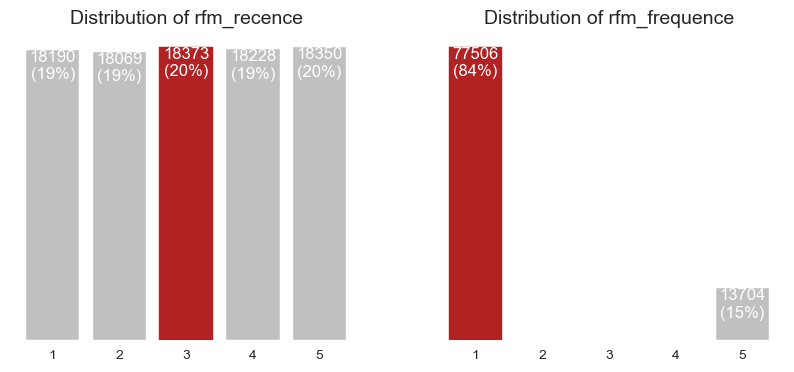

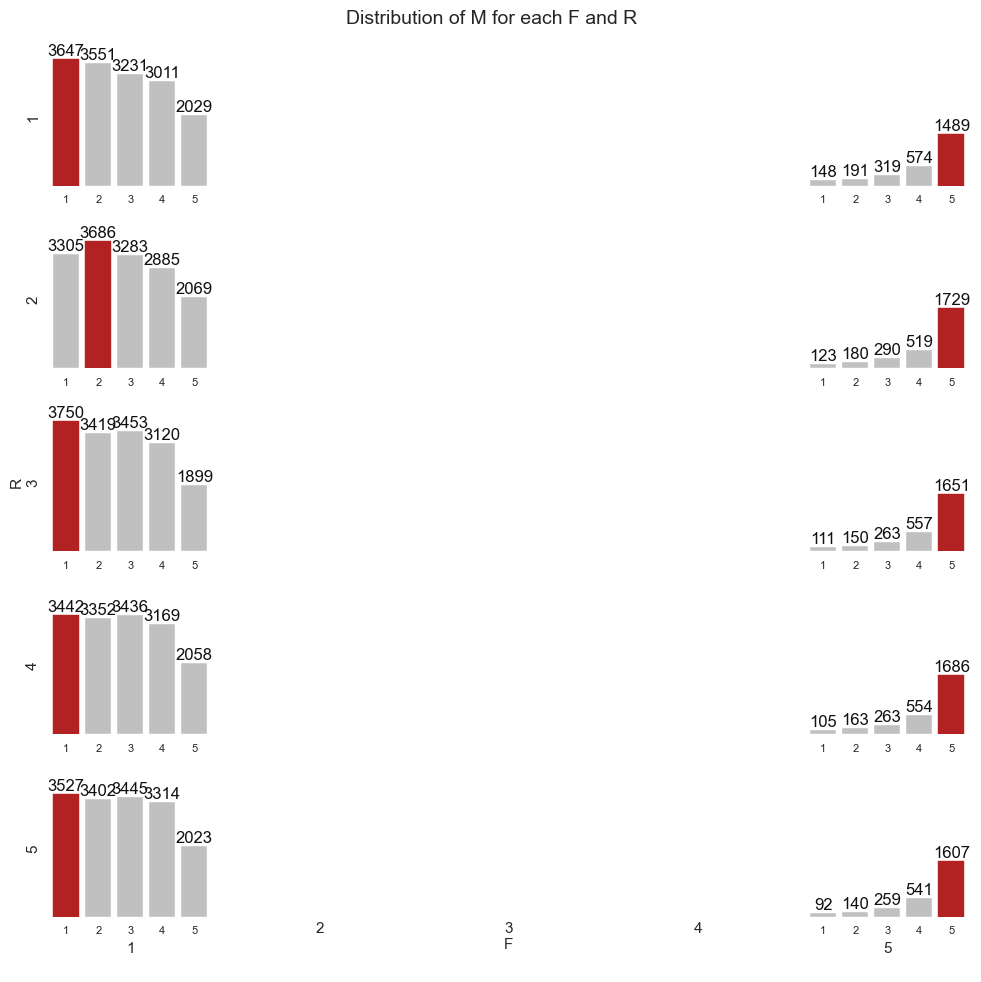

In [265]:
# plot the distribution of customers over R and F
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 4))

for i, p in enumerate(['R', 'F']):
    parameters = {'R':'rfm_recence', 'F':'rfm_frequence'}
    y = df_segm_rfm[p].value_counts().sort_index()
    x = y.index
    ax = axes[i]
    bars = ax.bar(x, y, color='silver')
    ax.set_frame_on(False)
    ax.tick_params(left=False, labelleft=False, bottom=False)
    ax.set_title('Distribution of {}'.format(parameters[p]),
                fontsize=14)
    for bar in bars:
        value = bar.get_height()
        if value == y.max():
            bar.set_color('firebrick')
        ax.text(bar.get_x() + bar.get_width() / 2,
                value - 5,
                '{}\n({}%)'.format(int(value), int(value * 100 / y.sum())),
               ha='center',
               va='top',
               color='w')

plt.show()

# plot the distribution of M for RF score
fig, axes = plt.subplots(nrows=5, ncols=5,
                         sharex=False, sharey=True,
                         figsize=(10, 10))

r_range = range(1, 6)
f_range = range(1, 6)
for r in r_range:
    for f in f_range:
        y = df_segm_rfm[(df_segm_rfm['R'] == r) & (df_segm_rfm['F'] == f)]['M'].value_counts().sort_index()
        x = y.index
        ax = axes[r - 1, f - 1]
        bars = ax.bar(x, y, color='silver')
        if r == 5:
            if f == 3:
                ax.set_xlabel('{}\nF'.format(f), va='top')
            else:
                ax.set_xlabel('{}\n'.format(f), va='top')
        if f == 1:
            if r == 3:
                ax.set_ylabel('R\n{}'.format(r))
            else:
                ax.set_ylabel(r)
        ax.set_frame_on(False)
        ax.tick_params(left=False, labelleft=False, bottom=False)
        ax.set_xticks(x)
        ax.set_xticklabels(x, fontsize=8)

        for bar in bars:
            value = bar.get_height()
            if value == y.max():
                bar.set_color('firebrick')
            ax.text(bar.get_x() + bar.get_width() / 2,
                    value,
                    int(value),
                    ha='center',
                    va='bottom',
                    color='k')
fig.suptitle('Distribution of M for each F and R',
             fontsize=14)
plt.tight_layout()
plt.show()

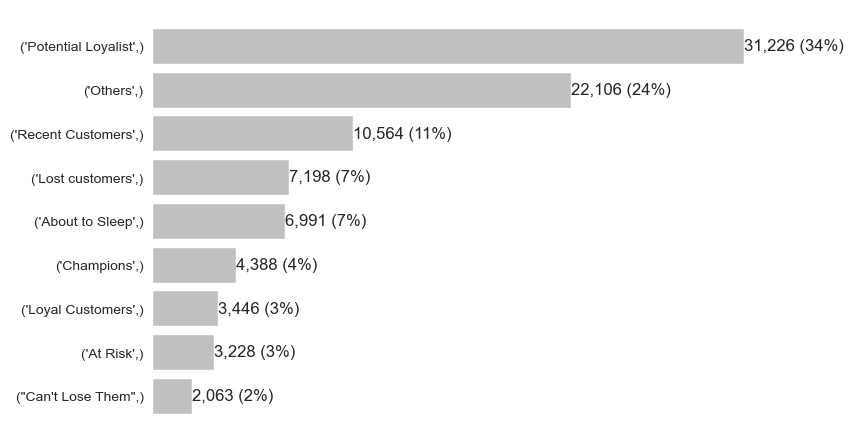

In [266]:
# count the number of customers in each segment
segments_counts = df_segm_rfm[['Segment']].value_counts().sort_values(ascending=True)

fig, ax = plt.subplots()

bars = ax.barh(range(len(segments_counts)),
              segments_counts,
              color='silver')
ax.set_frame_on(False)
ax.tick_params(left=False,
               bottom=False,
               labelbottom=False)
ax.set_yticks(range(len(segments_counts)))
ax.set_yticklabels(segments_counts.index)

for i, bar in enumerate(bars):
        value = bar.get_width()
        if segments_counts.index[i] in ['Champions', 'Loyal Customers']:
            bar.set_color('firebrick')
        ax.text(value,
                bar.get_y() + bar.get_height()/2,
                '{:,} ({:}%)'.format(int(value),
                                   int(value*100/segments_counts.sum())),
                va='center',
                ha='left'
               )

plt.show()

**Radar Chart des différentes catégories**

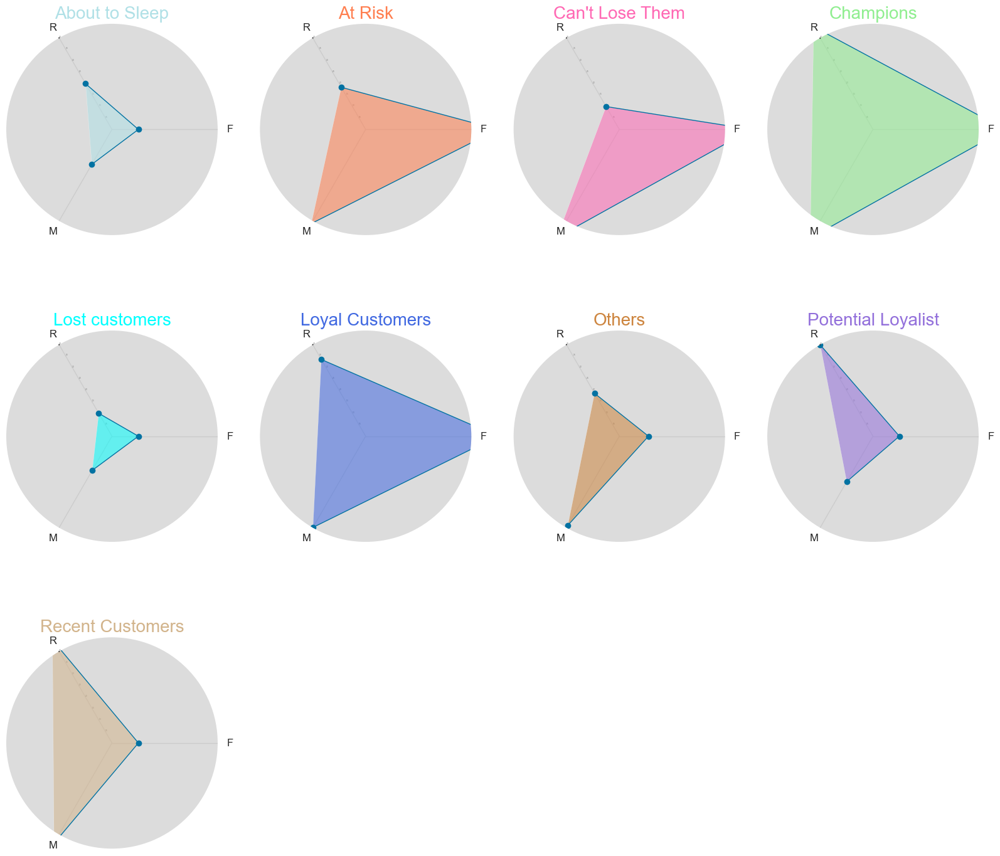

In [267]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_segm_rfm.groupby('Segment')[['R', 'F', 'M']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'Cyan',
          'RoyalBlue', 'Peru', 'MediumPurple', 'Tan', 'Silver',
          'RoyalBlue', 'DarkOrange']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

**Visualisation graphique 3d des différents clients associés à leur catégorie**

In [97]:
# Liste des couleurs pour chaque segment
pal = sns.color_palette("husl", len(categ))
colors = {label: color for label, color in zip(categ,
                                                 pal.as_hex())}

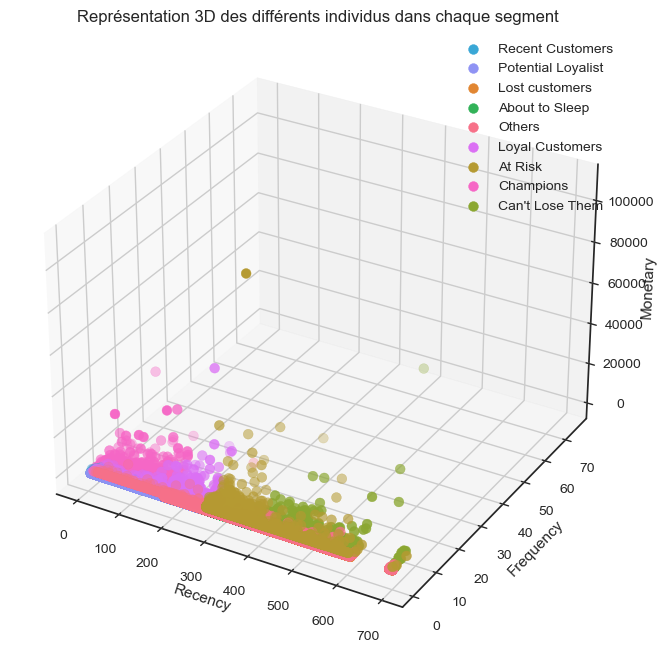

In [100]:
# Graphique 3D (x, y, z) = (Recency, Frequency, Monetary)
fonctions_segmentation.proj_3d_seg(df_segm_rfm, 'Segment', colors)

On constate graphiquement ici une visualisation très rectiligne de la segmentation

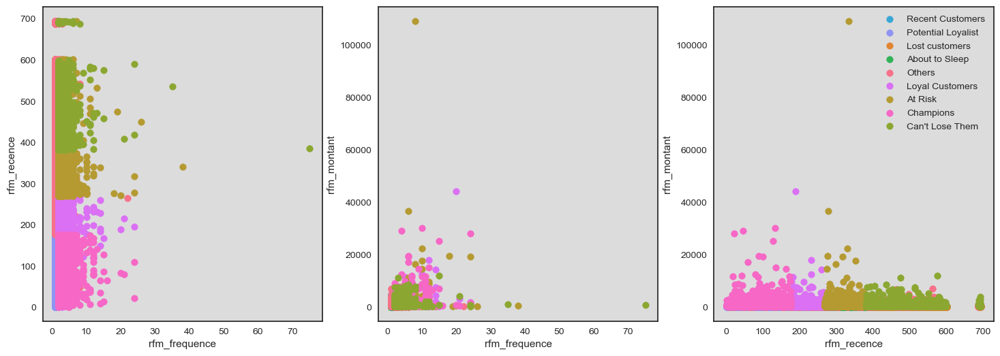

In [272]:
plt.figure(1, figsize=(18, 6))

# 2D plot, Frequence vs Recence
plt.subplot(1, 3, 1)
fonctions_segmentation.proj_2d_seg(df_segm_rfm,
                       "rfm_frequence",
                       "rfm_recence",
                       "Segment",
                       colors=colors)

# 2D plot, Frequency vs Monetary
plt.subplot(1, 3, 2)
fonctions_segmentation.proj_2d_seg(df_segm_rfm,
                       "rfm_frequence",
                       "rfm_montant",
                       "Segment",
                       colors=colors)

# 2D plot, Frequency vs Monetary
plt.subplot(1, 3, 3)
fonctions_segmentation.proj_2d_seg(df_segm_rfm,
                       "rfm_recence",
                       "rfm_montant",
                       "Segment",
                       colors=colors)

plt.legend()
plt.show()

**Squarify plot**

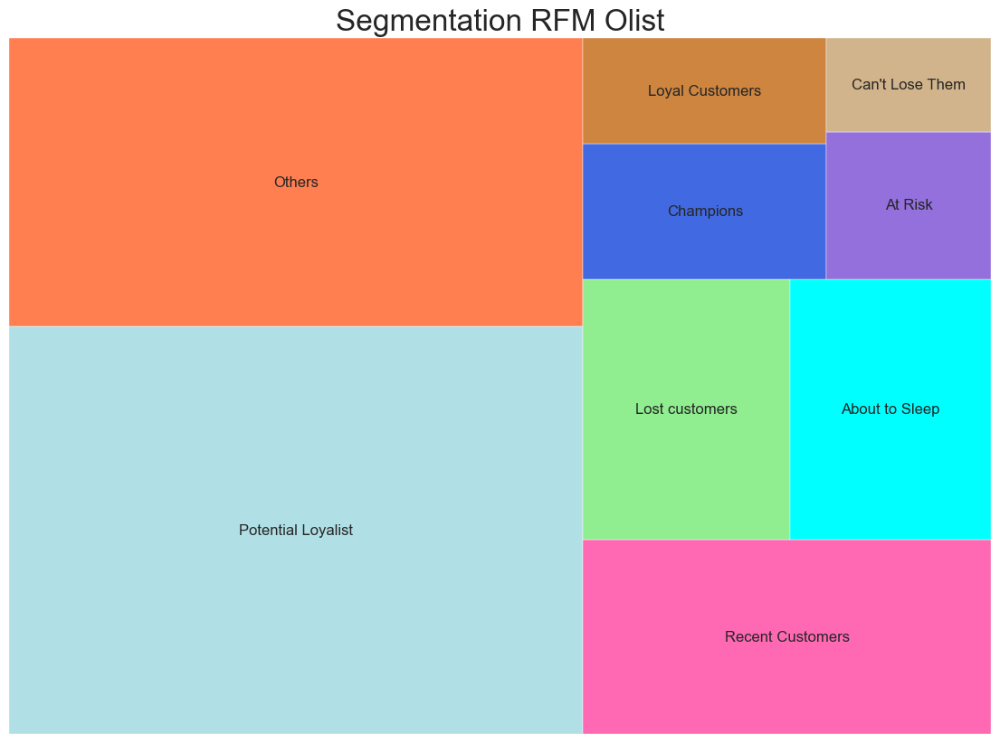

In [273]:
# Squarify plot des types de client
# --------------------------------------------------------------------

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'Cyan',
          'RoyalBlue', 'Peru', 'MediumPurple', 'Tan', 'Silver',
          'RoyalBlue', 'DarkOrange']
# Dataframe de travail
df_quarify_plot = \
    df_segm_rfm.groupby('Segment')['customer_unique_id'].nunique() \
    .sort_values(ascending=False).reset_index()
# Valeur mini and maxi
mini = min(df_quarify_plot['customer_unique_id'])
maxi = max(df_quarify_plot['customer_unique_id'])
# Trouver des couleurs pour chaque segment
norm = matplotlib.colors.Normalize(vmin=mini, vmax=maxi)
# Plotting
fig = plt.gcf()
ax = fig.add_subplot()
fig.set_size_inches(14, 10)
squarify.plot(sizes=df_quarify_plot['customer_unique_id'],
              label=df_quarify_plot.Segment, alpha=1,
              color=colors)
# Supprimer l'axe
plt.axis('off')
# Title
plt.title("Segmentation RFM Olist", fontsize=24)
# Title Positioning
ttl = ax.title
ttl.set_position([.5, 1.05])
plt.show()

## <span style='background:lightblue'>3. Segmentation RFM - K-Means</span>

La démarche avec la méthodologie du K-Means sere d'effectuer une séparation de nos clients en groupe.

In [27]:
# Création du datframe de segmentation RFM avec K-Means
df_segm_rfm_kmeans = df_segm_rfm.copy()

In [28]:
df_segm_rfm_kmeans = df_segm_rfm_kmeans.set_index('customer_unique_id')
df_segm_rfm_kmeans.head()

,rfm_recence,rfm_frequence,rfm_montant,R,F,M,RFM_Segment,RFM Score,RFM_Score,Segment
customer_unique_id,,,,,,,,,,
0000366f3b9a7992bf8c76cfdf3221e2,112,1,141.90,4,1,4,414,414,9,Recent Customers
0000b849f77a49e4a4ce2b2a4ca5be3f,115,1,27.19,4,1,1,411,411,6,Potential Loyalist
0000f46a3911fa3c0805444483337064,537,1,86.22,1,1,2,112,112,4,Lost customers
0000f6ccb0745a6a4b88665a16c9f078,321,1,43.62,2,1,1,211,211,4,About to Sleep
0004aac84e0df4da2b147fca70cf8255,288,1,196.89,2,1,4,214,214,7,Others


In [29]:
# Valeurs négatives ?
df_segm_rfm_kmeans[['rfm_recence', 'rfm_frequence', 'rfm_montant']] \
    .describe()

,rfm_recence,rfm_frequence,rfm_montant
count,91210.000000,91210.000000,91210.000000
mean,237.114001,1.237671,212.354612
std,152.571859,0.844742,631.935302
min,1.000000,1.000000,9.590000
25%,114.000000,1.000000,63.830000
50%,218.000000,1.000000,112.880000
75%,345.000000,1.000000,202.760000
max,695.000000,75.000000,109312.640000


Nous n'avons pas de valeur négative en vue: on peut effectuer la transformation en log

In [30]:
# Transformer les valeurs en logarithme pour que chaque variable aie
# le même poids
cols_preproc = ['rfm_recence', 'rfm_frequence', 'rfm_montant']
df_rfm_log = df_segm_rfm_kmeans[cols_preproc].apply(np.log, axis=1)
df_rfm_pow = df_segm_rfm_kmeans[cols_preproc]

### <span>Analyse graphique de la segmentation RFM</span>

**Distribution en histogramme**

In [82]:
def plot_hist(rfm, figsize=(20, 10)):

    plt.figure(1, figsize=figsize)

    for i, col in enumerate(rfm):
        plt.subplot(len(rfm.columns), 1, i + 1)
        plt.hist(rfm[col],
                 bins=int(1 + np.log(len(rfm))),
                 label='skweness : ' + str(round(rfm[col].skew(), 2)),
                 density=True)
        plt.ylabel("Nombre de clients (%)")
        plt.xlabel(col)
        plt.legend()
    plt.show()

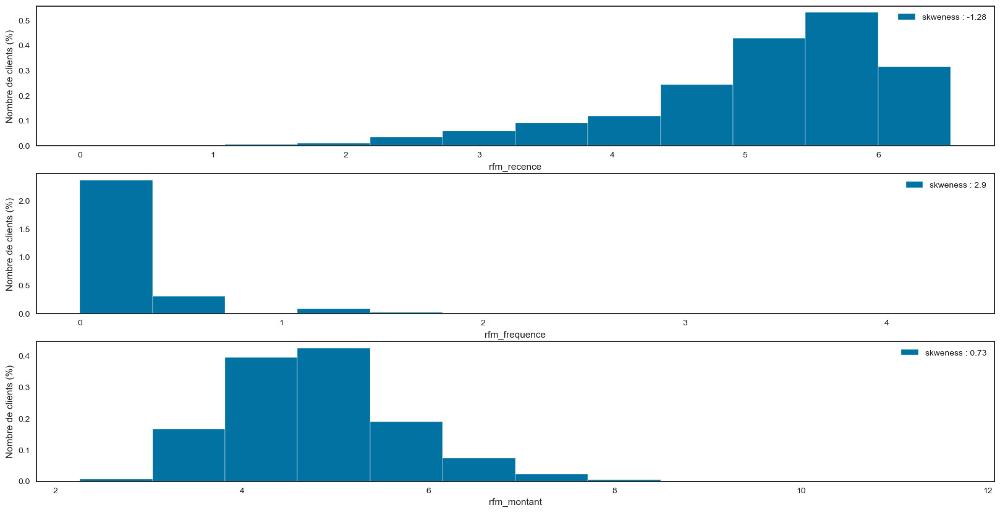

In [83]:
# Histogramme des variables 'Recency', 'Frequency' et 'Monetary'
plot_hist(df_rfm_log)

Les skewness des variables étudiés sont soit passés en dessous de 1 soit beaucoup plus proches de 1(ou -1), ce qui montre l'efficacité de l'application du logarithme sur nos variables

**Normalisation des données**

In [84]:
# Encodeur par normalisation
encoder = StandardScaler()

# Normalisation des données
var_rfm_transformed = encoder.fit_transform(
    df_rfm_log[["rfm_recence", "rfm_frequence", "rfm_montant"]])

# Convertis les données en DataFrame
df_rfm_log_convert = pd.DataFrame(var_rfm_transformed,
                         index=df_rfm_log.index,
                         columns=["rfm_recence", "rfm_frequence", "rfm_montant"])

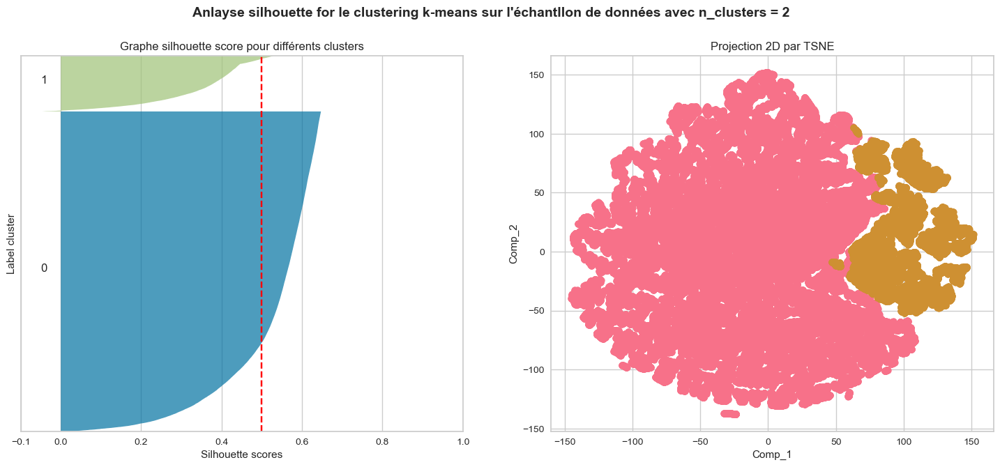

Pour n_clusters = 2 
 Le silhouette score moyen est de : 0.49945951984632814 
 Le temps d'entrainement du modèle est de : 2.1493852138519287 (s) 
 Le score de Gini est de : 0.5


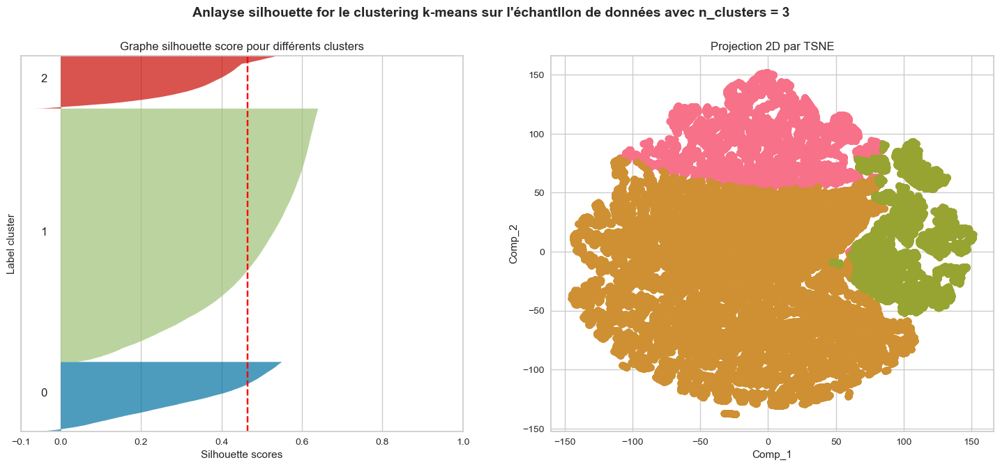

Pour n_clusters = 3 
 Le silhouette score moyen est de : 0.46451154608116463 
 Le temps d'entrainement du modèle est de : 1.6800631284713745 (s) 
 Le score de Gini est de : 0.45554124182289957


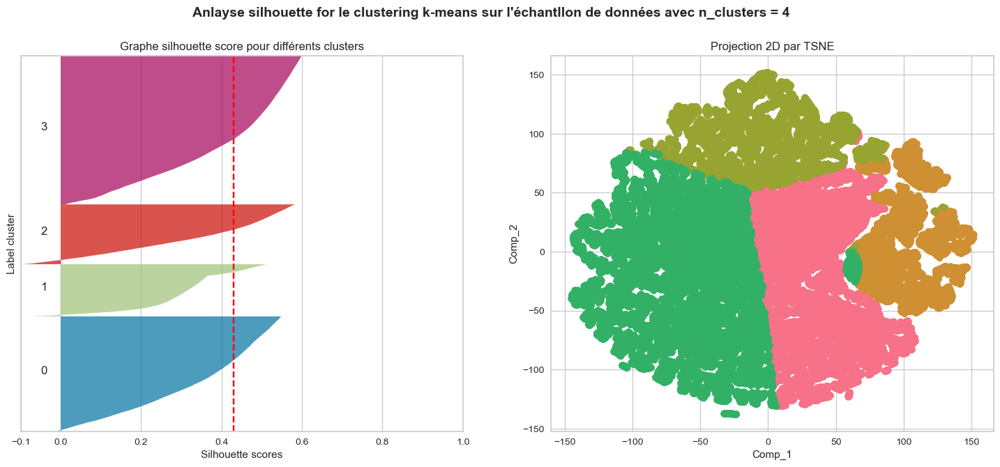

Pour n_clusters = 4 
 Le silhouette score moyen est de : 0.42974159381453125 
 Le temps d'entrainement du modèle est de : 1.538404067357381 (s) 
 Le score de Gini est de : 0.4918295995809427


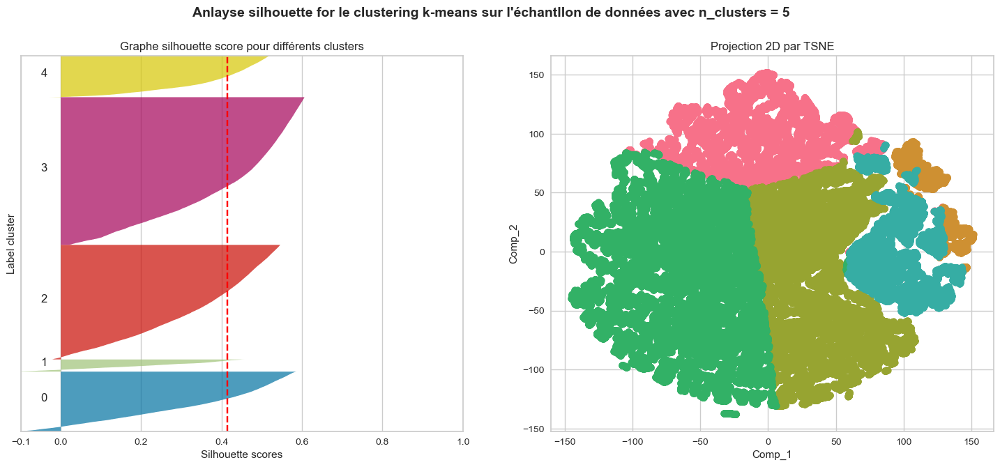

Pour n_clusters = 5 
 Le silhouette score moyen est de : 0.4138918806414539 
 Le temps d'entrainement du modèle est de : 1.479350984096527 (s) 
 Le score de Gini est de : 0.5019658845886782


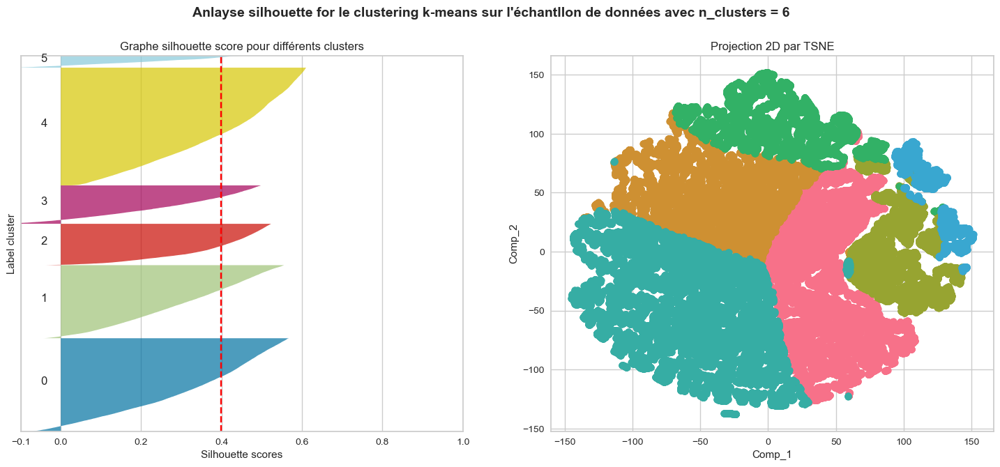

Pour n_clusters = 6 
 Le silhouette score moyen est de : 0.39851460283073264 
 Le temps d'entrainement du modèle est de : 1.4794351577758789 (s) 
 Le score de Gini est de : 0.497536600518949


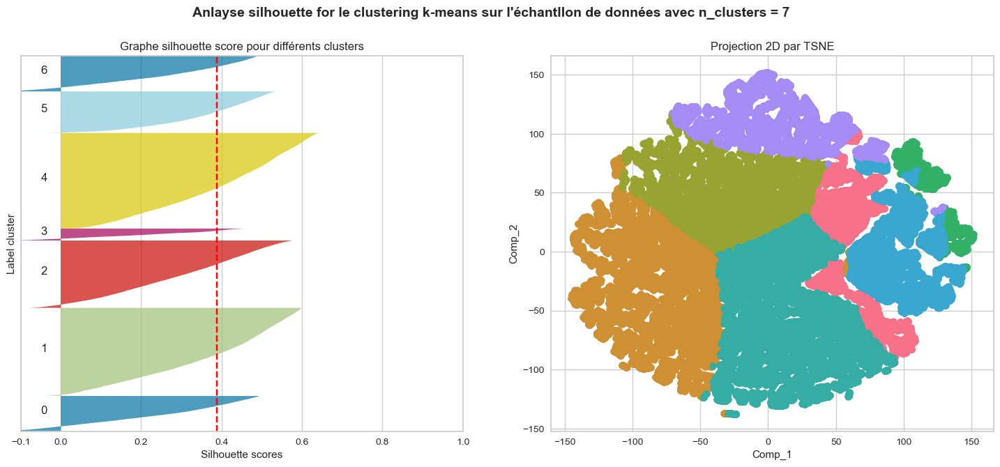

Pour n_clusters = 7 
 Le silhouette score moyen est de : 0.3877979092696561 
 Le temps d'entrainement du modèle est de : 1.4979571898778279 (s) 
 Le score de Gini est de : 0.4898648244153123


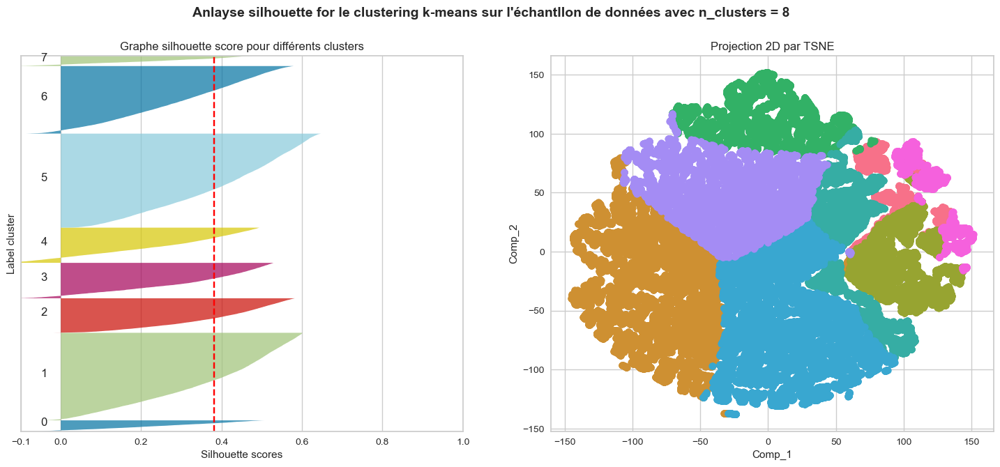

Pour n_clusters = 8 
 Le silhouette score moyen est de : 0.3808913637677406 
 Le temps d'entrainement du modèle est de : 1.5368594442095076 (s) 
 Le score de Gini est de : 0.48625197551885574


([0.49945951984632814,
  0.42956357231600106,
  0.36020168928126456,
  0.36634274112222187,
  0.33700549158784787,
  0.3342144414642733,
  0.3394520907562476],
 [0.5,
  0.41108248364579913,
  0.5644063150970289,
  0.5323747396118846,
  0.4798194642400323,
  0.451505943897129,
  0.46457488214011616],
 [2.1493852138519287,
  1.2107410430908203,
  1.2550859451293945,
  1.3021917343139648,
  1.4797718524932861,
  1.5905673503875732,
  1.770272970199585])

In [29]:
# Visualisation des clusterings sur les données quantitatives standardisées, transformées en logarithme

range_nb_clusters = range(2, 9)
fonctions_segmentation.variation_clustering(df_rfm_log_convert, range_nb_clusters)

**Constatation**:

- Les meilleurs scores sont enregistrés avec K=3 Clusters, avec un score silhouette moyen de 0.4645, et un indice de Gini de 0.4555

- Nombre de clusters optimaux: **K=3**

In [31]:
# Standardisation StandardScaler
# -----------------------------------------------------------------------
scaler = StandardScaler()
df_rfm_scaled = scaler.fit_transform(df_rfm_log)
# Dataframe
df_rfm_scaled = pd.DataFrame(df_rfm_scaled, index=df_segm_rfm_kmeans.index,
                             columns=df_rfm_log.columns)

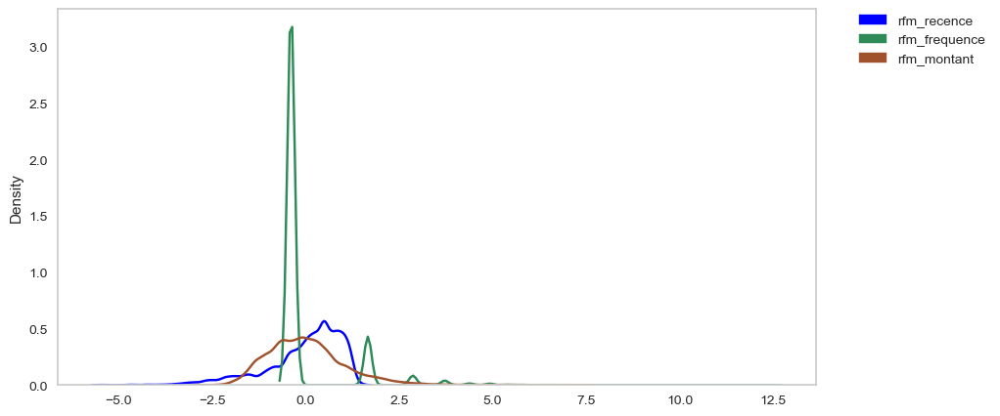

In [32]:
# Visualisation

plt.figure(figsize=(10, 5))
axes = plt.axes()

label_patches = []
colors = ['Blue', 'SeaGreen', 'Sienna', 'DodgerBlue', 'Purple']

i = 0
for col in df_rfm_scaled.columns:
    label = col
    sns.kdeplot(df_rfm_scaled[col], color=colors[i])
    label_patch = mpatches.Patch(
        color=colors[i],
        label=label)
    label_patches.append(label_patch)
    i += 1
plt.xlabel('')
plt.legend(
    handles=label_patches,
    bbox_to_anchor=(
        1.05,
        1),
    loc=2,
    borderaxespad=0.,
    facecolor='white')
plt.grid(False)
axes.set_facecolor('white')

plt.show()

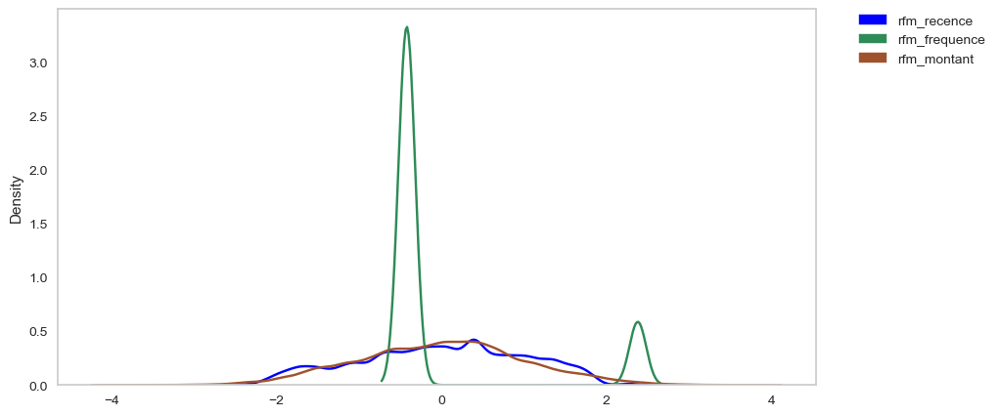

In [33]:
# Standardisation PowerTransformer box-cox
# -----------------------------------------------------------------------
scaler_pow = PowerTransformer(method='box-cox')
df_rfm_scaled_pow = scaler_pow.fit_transform(df_rfm_pow)
# Dataframe
df_rfm_scaled_pow = pd.DataFrame(df_rfm_scaled_pow,
                                 index=df_segm_rfm_kmeans.index,
                                 columns=df_rfm_log.columns)
# Visualisation
plt.figure(figsize=(10, 5))
axes = plt.axes()

label_patches = []
colors = ['Blue', 'SeaGreen', 'Sienna', 'DodgerBlue', 'Purple']

i = 0
for col in df_rfm_scaled_pow.columns:
    label = col
    sns.kdeplot(df_rfm_scaled_pow[col], color=colors[i])
    label_patch = mpatches.Patch(
        color=colors[i],
        label=label)
    label_patches.append(label_patch)
    i += 1
plt.xlabel('')
plt.legend(
    handles=label_patches,
    bbox_to_anchor=(
        1.05,
        1),
    loc=2,
    borderaxespad=0.,
    facecolor='white')
plt.grid(False)
axes.set_facecolor('white')

plt.show()

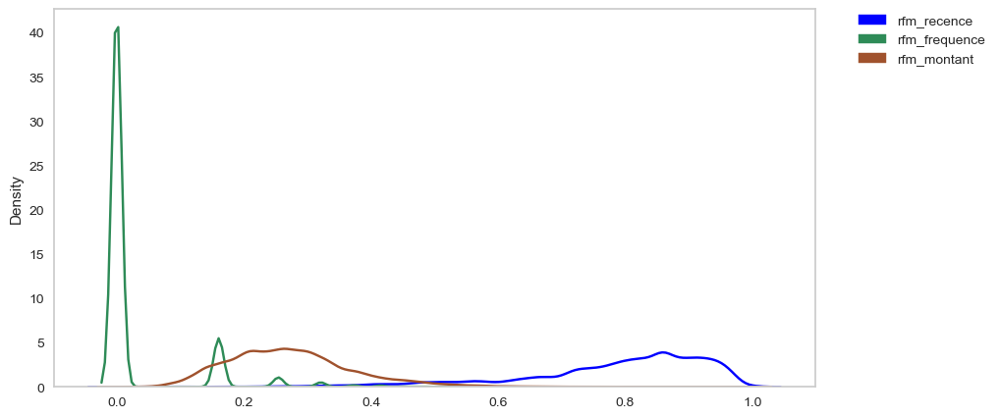

In [34]:
# Standardisation MinMaxScaler
# -----------------------------------------------------------------------
scaler_min = MinMaxScaler()
df_rfm_scaled_min = scaler_min.fit_transform(df_rfm_log)
# Dataframe
df_rfm_scaled_min = pd.DataFrame(df_rfm_scaled_min,
                                 index=df_segm_rfm_kmeans.index,
                                 columns=df_rfm_log.columns)
# Visualisation

plt.figure(figsize=(10, 5))
axes = plt.axes()

label_patches = []
colors = ['Blue', 'SeaGreen', 'Sienna', 'DodgerBlue', 'Purple']

i = 0
for col in df_rfm_scaled_min.columns:
    label = col
    sns.kdeplot(df_rfm_scaled_min[col], color=colors[i])
    label_patch = mpatches.Patch(
        color=colors[i],
        label=label)
    label_patches.append(label_patch)
    i += 1
plt.xlabel('')
plt.legend(
    handles=label_patches,
    bbox_to_anchor=(
        1.05,
        1),
    loc=2,
    borderaxespad=0.,
    facecolor='white')
plt.grid(False)
axes.set_facecolor('white')

plt.show()

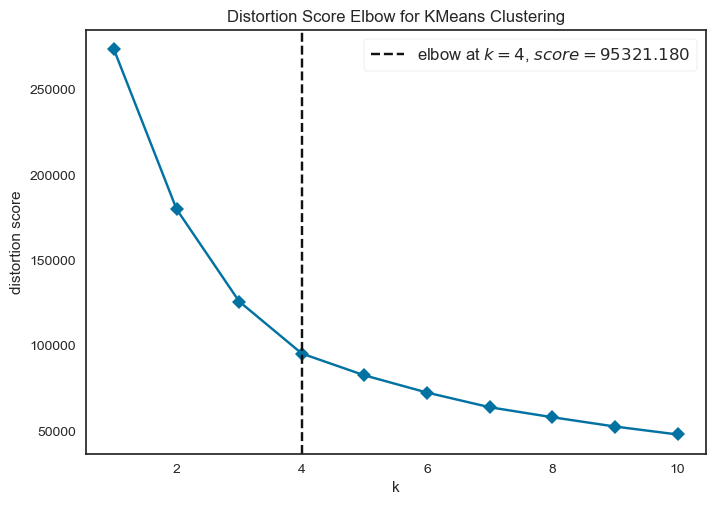

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [89]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(1, 11), timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled)
visualizer.show()

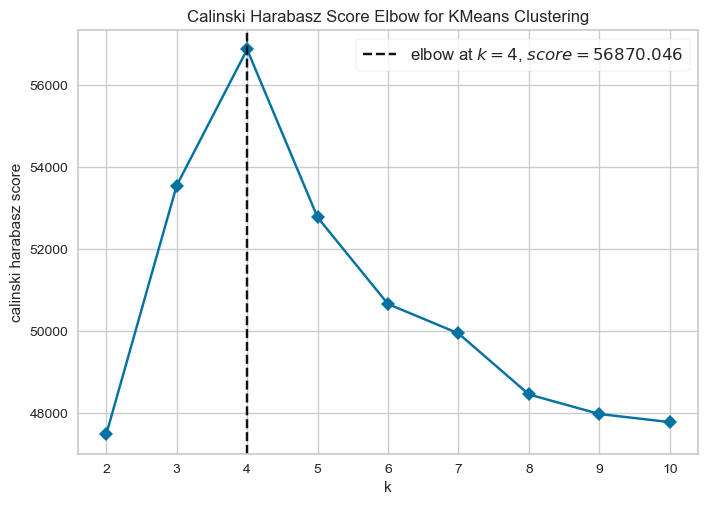

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [30]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled)
visualizer.show()

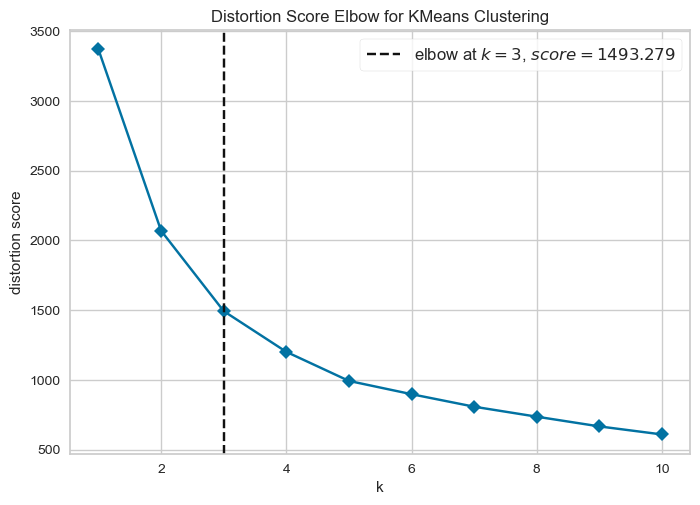

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [31]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(1, 11), timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_min)
visualizer.show()

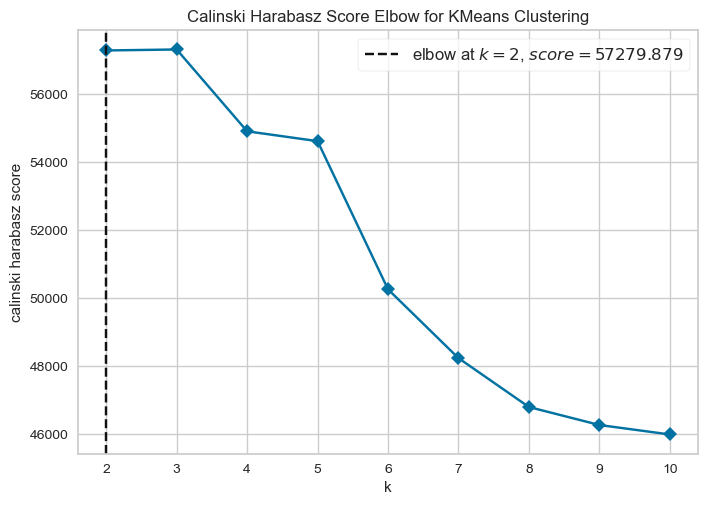

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [32]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_min)
visualizer.show()

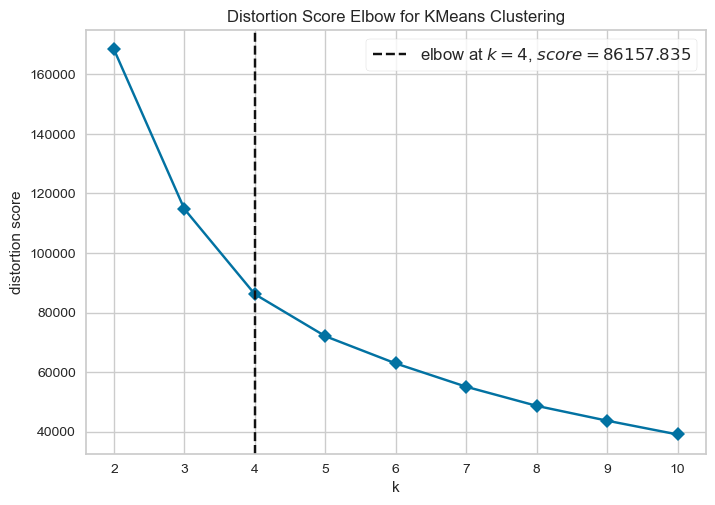

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [33]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = distortion ( calcule la somme des distances au carré entre
# chaque point et le centre qui lui est attribué)
visualizer = KElbowVisualizer(model, k=(2, 11), timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_pow)
visualizer.show()

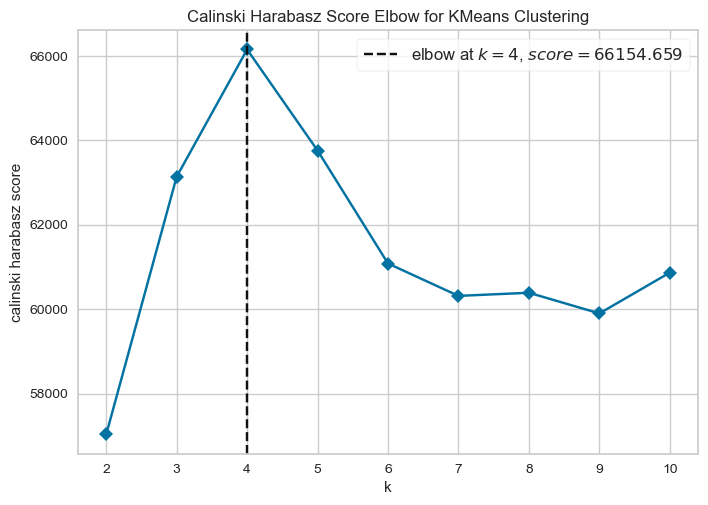

<Axes: title={'center': 'Calinski Harabasz Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='calinski harabasz score'>

In [34]:
# Instanciation du modèle
model = KMeans()

# Hyperparamètre k entre 1 et 11
# métrique = calinski_harabasz (calcule le rapport de dispersion entre
# et au sein des clusters)
visualizer = KElbowVisualizer(model, k=(2, 11),
                              metric='calinski_harabasz', timings=False)

# Entraîne le modèle
visualizer.fit(df_rfm_scaled_pow)
visualizer.show()

- La valeur du meilleur hyperparamètre k est '4' comme StandardScaler.

In [39]:
# Clustering avec k=4 comme meilleur hyperparamètre
clus = KMeans(n_clusters=4, init='k-means++', max_iter=300)
clus.fit(df_rfm_scaled)

KMeans(n_clusters=4)

In [40]:
# AJout du groupe de cluster au jeu de données
df_segm_rfm['K_Cluster'] = clus.labels_
df_segm_rfm_kmeans['K_Cluster'] = clus.labels_
cluster_labels = clus.labels_

In [92]:
# Clustering avec k=4 comme meilleur hyperparamètre
clus_pow = KMeans(n_clusters=4, init='k-means++', max_iter=300)
clus_pow.fit(df_rfm_scaled_pow)

KMeans(n_clusters=4)

In [93]:
# Ajout du groupe de cluster au jeu de données
df_segm_rfm['K_pow_Cluster'] = clus_pow.labels_
df_segm_rfm_kmeans['K_pow_Cluster'] = clus_pow.labels_
cluster_labels_pow = clus_pow.labels_

<span style='background:gold'>**RFM quartiles vs K-Means**</span>

In [94]:
# Constitution du dataframe de travail données StandardScaler
# --------------------------------------------------------------------
# Ajout de la colonne de cluster
df_rfm_scaled['K_Cluster'] = clus.labels_
#df_rfm_scaled['RFM_Niveau'] = df_segm_rfm_kmeans['RFM_Niveau']
df_rfm_scaled['Segment'] = df_segm_rfm_kmeans['Segment']
df_rfm_scaled.reset_index(inplace=True)

# Melt du dataframe
df_rfm_melted = pd.melt(frame=df_rfm_scaled,
                        id_vars=['customer_unique_id', 
                                 'Segment', 'K_Cluster'],
                        var_name='Metrics', value_name='Value')
df_rfm_melted.sort_values(by='Metrics', inplace=True)
df_rfm_melted.head()

,customer_unique_id,Segment,K_Cluster,Metrics,Value
136814,7fbecaab8a33b21ca0bb6ee1f4d26658,Recent Customers,2,rfm_frequence,-0.386987
121606,5515995dc7e8ee912a40eed563c01f16,Potential Loyalist,2,rfm_frequence,-0.386987
121607,5516a01cd9074eebb614c48d6fcac88a,Recent Customers,1,rfm_frequence,-0.386987
121608,551707eb3a424c50d32faad35f2b8937,Potential Loyalist,0,rfm_frequence,-0.386987
121609,5517917434ed6488c5aa1f2aec53de18,Potential Loyalist,0,rfm_frequence,-0.386987


In [95]:
# Constitution du dataframe de travail données PowerTransformer
# --------------------------------------------------------------------
# Ajout de la colonne de cluster
df_rfm_scaled_pow['K_pow_Cluster'] = clus_pow.labels_
#df_rfm_scaled_pow['RFM_Niveau'] = df_segm_rfm_kmeans['RFM_Niveau']
df_rfm_scaled_pow['Segment'] = df_segm_rfm_kmeans['Segment']
df_rfm_scaled_pow.reset_index(inplace=True)

# Melt du dataframe
df_rfm_melted_pow = pd.melt(frame=df_rfm_scaled_pow,
                            id_vars=['customer_unique_id', 
                                     'Segment', 'K_pow_Cluster'],
                            var_name='Metrics', value_name='Value')
df_rfm_melted_pow.sort_values(by='Metrics', inplace=True)
df_rfm_melted_pow.head()

,customer_unique_id,Segment,K_pow_Cluster,Metrics,Value
136814,7fbecaab8a33b21ca0bb6ee1f4d26658,Recent Customers,3,rfm_frequence,-0.420489
121606,5515995dc7e8ee912a40eed563c01f16,Potential Loyalist,2,rfm_frequence,-0.420489
121607,5516a01cd9074eebb614c48d6fcac88a,Recent Customers,2,rfm_frequence,-0.420489
121608,551707eb3a424c50d32faad35f2b8937,Potential Loyalist,0,rfm_frequence,-0.420489
121609,5517917434ed6488c5aa1f2aec53de18,Potential Loyalist,0,rfm_frequence,-0.420489


<span style='background:gold'>**Niveau des 11 segments des clients**</span>

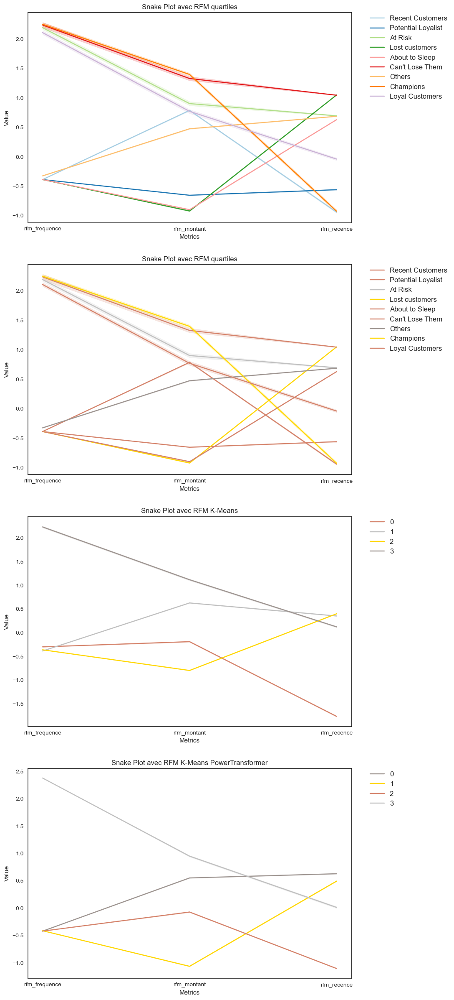

In [41]:
# Niveau des 11 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Visualisation : Snake plot de comparaison méthode quartiles/K-Means
# --------------------------------------------------------------------

plt.figure(figsize=(10, 30))

sns.set_style('white')

# Snake plot pour RFM quartiles
plt.subplot(4, 1, 1)
sns.lineplot(x='Metrics', y='Value', hue='Segment',
             data=df_rfm_melted, palette='Paired')
plt.title('Snake Plot avec RFM quartiles')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

# Snake plot pour RFM quartiles avec couleurs de K-Means
plt.subplot(4, 1, 2)
sns.lineplot(x='Metrics', y='Value', hue='Segment',
             data=df_rfm_melted, palette=['#d5836b', '#d5836b',
                                          '#C0C0C0', 'Gold',
                                          '#d5836b', '#d5836b',
                                          '#9e9591', 'Gold',
                                          '#d5836b', '#d5836b',
                                          'Gold', 'Gold'])
plt.title('Snake Plot avec RFM quartiles')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

# Snake plot avec RFM K-Means
plt.subplot(4, 1, 3)
sns.lineplot(x='Metrics', y='Value', hue='K_Cluster',
             data=df_rfm_melted, palette=['#d5836b', '#C0C0C0',
                                          'Gold', '#9e9591'])
plt.title('Snake Plot avec RFM K-Means')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

# Snake plot avec RFM K-Means PowerTransfromer
plt.subplot(4, 1, 4)
sns.lineplot(x='Metrics', y='Value', hue='K_pow_Cluster',
             data=df_rfm_melted_pow, palette=['#9e9591', 'Gold',
                                              '#d5836b', '#C0C0C0'])
plt.title('Snake Plot avec RFM K-Means PowerTransformer')
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=12)

plt.show()

In [96]:
# Niveau des 11 segments clients : Client perdu, nouveau client,...
# --------------------------------------------------------------------
df_plot_segm = df_segm_rfm_kmeans.copy()
df_plot_segm = df_segm_rfm_kmeans[['rfm_recence', 'rfm_frequence',
                                   'rfm_montant', 'Segment']]
# Encodage manuelle Segment dans K_segm_client
df_plot_segm['K_segm_client'] = ['1' if row == 'Champions'
                                 else '2' if row == 'Loyal Customers'
                                 else '3' if row == 'Potential Loyalist'
                                 else '4' if row == 'Recent Customers'
                                 else '5' if row == 'Promising'
                                 else '6' if row == 'Need Attention'
                                 else '7' if row == 'About to Sleep'
                                 else '8' if row == 'Can\'t Lose Them'
                                 else '9' if row == 'At Risk'
                                 else '10' if row == 'Lost customers'
                                 else '11' 
                                 for row in df_plot_segm['Segment']]
df_plot_segm.drop(columns=['Segment'], inplace=True)

In [97]:
# Initialise TSNE
model = TSNE(random_state=1)
transformed_seg = model.fit_transform(df_plot_segm)

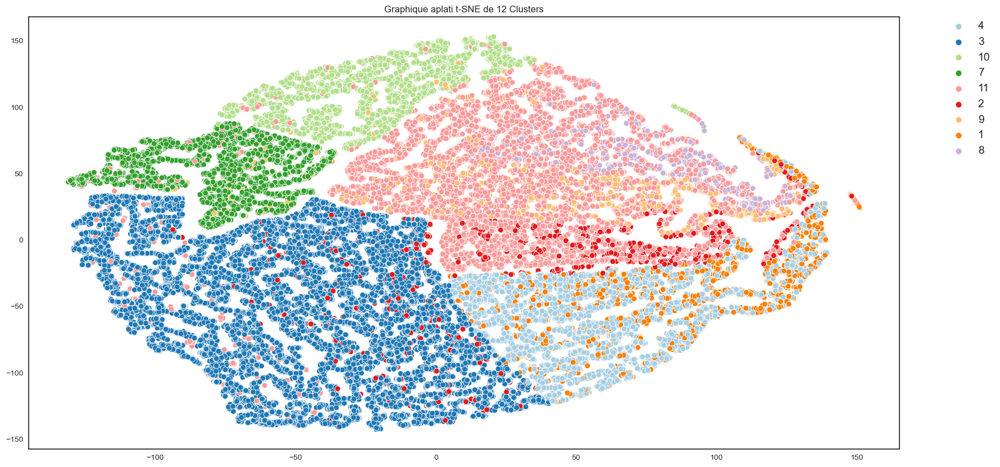

In [98]:
# Plot t-SNE
plt.figure(figsize=(20, 10))

sns.set_style('white')
palette = sns.color_palette('Paired', n_colors=12)

liste_k_seg = df_plot_segm['K_segm_client'].to_list()
plt.title('Graphique aplati t-SNE de 12 Clusters')
sns.scatterplot(x=transformed_seg[:, 0], y=transformed_seg[:, 1],
                hue=liste_k_seg, palette=palette)
plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,
           fontsize=14)
plt.show()

**Réduction ACP**

***Données transformées en log standardisées***

In [40]:
# Analyse en composante principale
df_acp = df_rfm_scaled.copy()[['rfm_recence', 'rfm_frequence',
                               'rfm_montant']]

In [41]:
# Sélection des colonnes pour l'ACP
cols_acp = df_acp.columns.to_list()
# Nombre de composantes
n_comp = len(cols_acp)

# Calcul des composantes principales
pca = decomposition.PCA(n_components=n_comp)
pca.fit(var_rfm_transformed)

PCA(n_components=3)

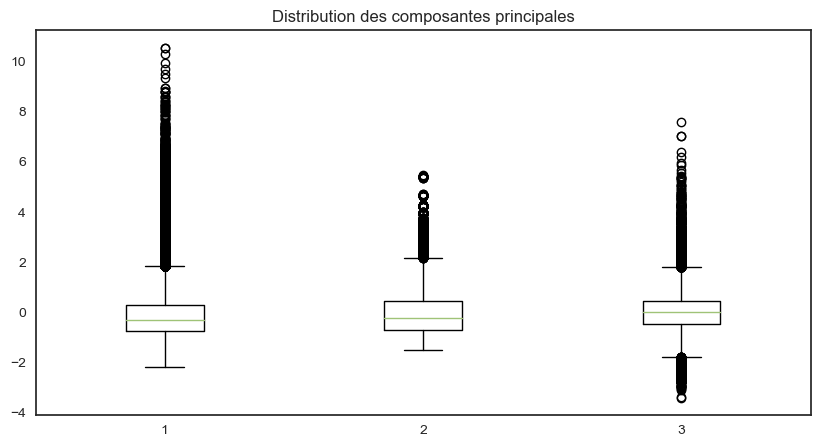

In [42]:
# Composantes principales de l'ACP
C = pca.transform(var_rfm_transformed)
plt.figure(figsize=(10, 5))
plt.boxplot(C)
plt.title('Distribution des composantes principales')
plt.grid(False)
plt.show()

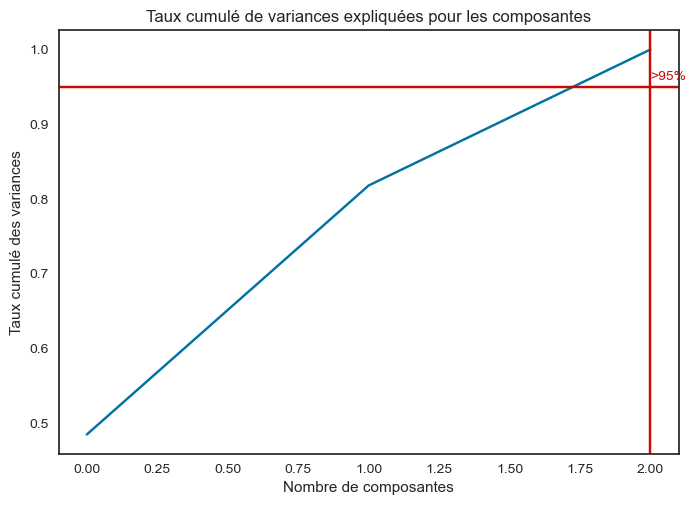

In [43]:
# quel est le pourcentage de variance préservée par chacune de
# nos composantes?
variances = pca.explained_variance_ratio_

# quelle est la somme cumulée de chacune de ces variances?
meilleur_dims = np.cumsum(variances)

#  on va trouver le moment où on attient 95% ou 99% entre réduire au maxi
# où garder au maxi
plt.plot(meilleur_dims)
# argmax pour > 95 %
best = np.argmax(meilleur_dims > 0.95)
plt.axhline(y=0.95, color='r')
plt.text(2, 0.96, '>95%', color='r', fontsize=10)
plt.axvline(x=best, color='r')
plt.title('Taux cumulé de variances expliquées pour les composantes')
plt.xlabel('Nombre de composantes')
plt.ylabel('Taux cumulé des variances')
plt.show()

Nous avons 2 composantes expliquant 95 % de la variance

**Affichage valeurs propres**

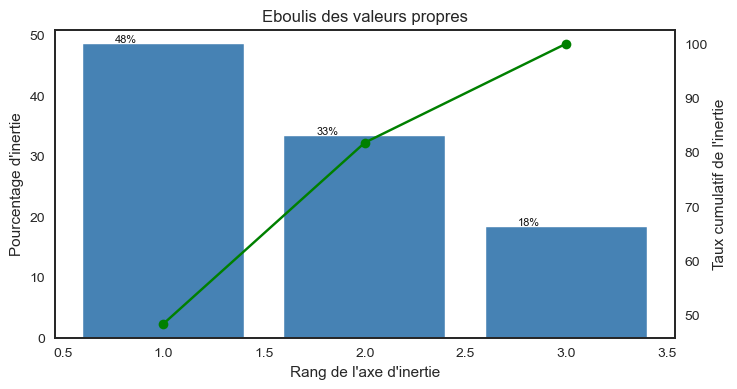

In [44]:
fonctions_data.aff_eboulis_plot(pca)

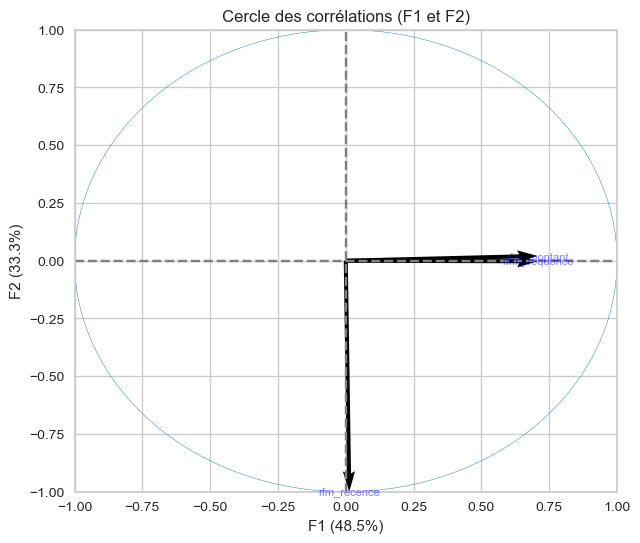

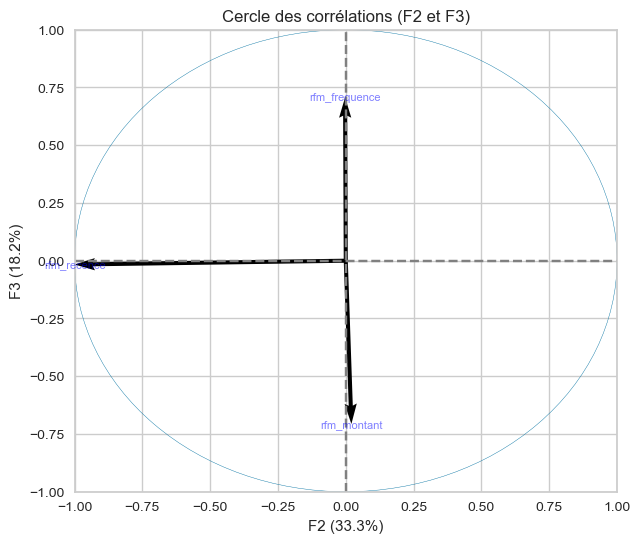

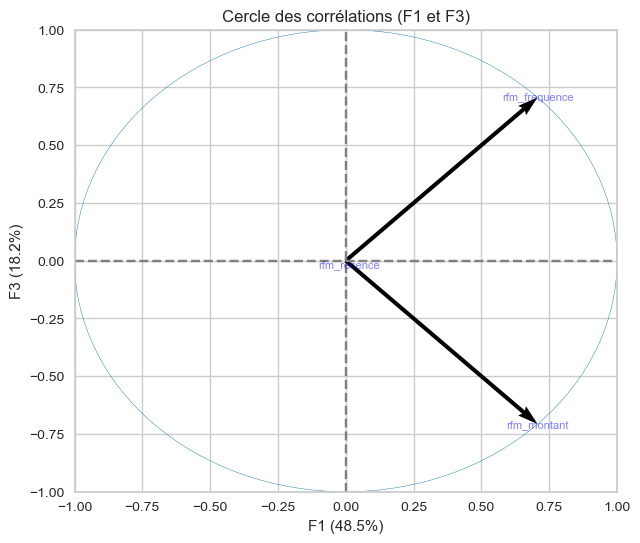

In [35]:
# Cercle des correlations
pcs = pca.components_
liste_tuples_comp = [(0, 1), (1, 2), (0, 2)]
fonctions_data.affiche_cercle(pcs, n_comp, pca, liste_tuples_comp, labels=np.array(cols_acp), label_rotation=0, lims=None)

- Il faut conserver les 3 variables pour expliquer plus de 90% de la variance.
- La première dimension représente les clients dépensiers avec des commandes fréquentes et des montants corrects.
- La seconde dimension représente les commandes récentes, cients fidèles.
- La troisième dimension montre que les commandes fréquentes ont des petits montants et inversement.

**Projection sur le plan factoriel**

In [45]:
# ACP décomposition
pca_rfm = decomposition.PCA()
pca_rfm.fit(df_acp)
expl_var = pca_rfm.explained_variance_ratio_.cumsum()*100
display(f'Explication de la variance : {expl_var}')
X_trsf = pca_rfm.transform(df_acp)

'Explication de la variance : [ 48.45280666  81.78772307 100.        ]'

<span style='background:gold'>**Niveau des clients: rang I (meilleurs) à IV**</span>

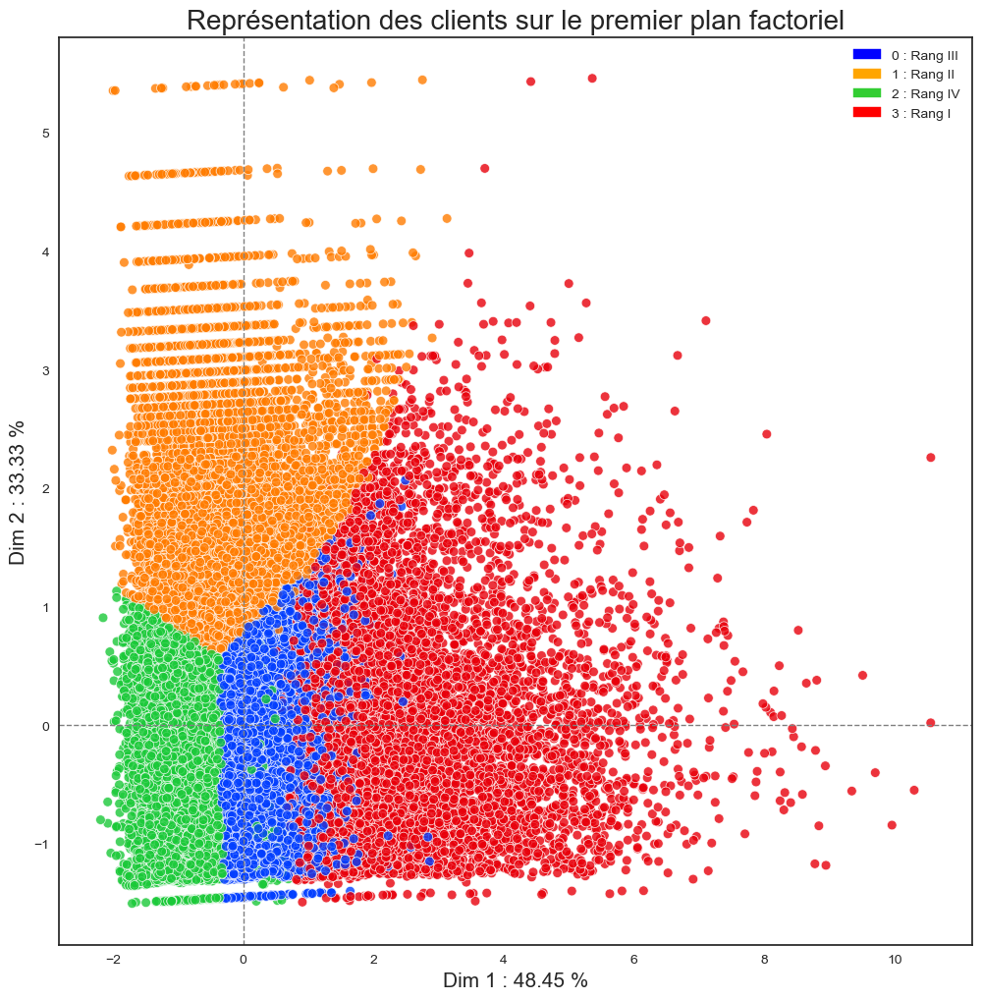

In [52]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA = pd.DataFrame({
    'Dim1' : X_trsf[:, 0], 
    'Dim2' : X_trsf[:, 1],
    'Cluster' : clus.labels_
})

fig = plt.figure(figsize=(12, 12))

sns.set_style('white')

g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA,
                        hue = 'Cluster', palette='bright', alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)

plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)

cluster_0 = mpatches.Patch(color='Blue', label='0 : Rang III')
cluster_1 = mpatches.Patch(color='Orange', label='1 : Rang II')
cluster_2 = mpatches.Patch(color='LimeGreen', label='2 : Rang IV')
cluster_3 = mpatches.Patch(color='Red', label='3 : Rang I')
plt.legend(handles=[cluster_0, cluster_1, cluster_2, cluster_3])

plt.show()

<span style='background:gold'>**Decomposition de la segmentation des 11 catégories de clients**</span>

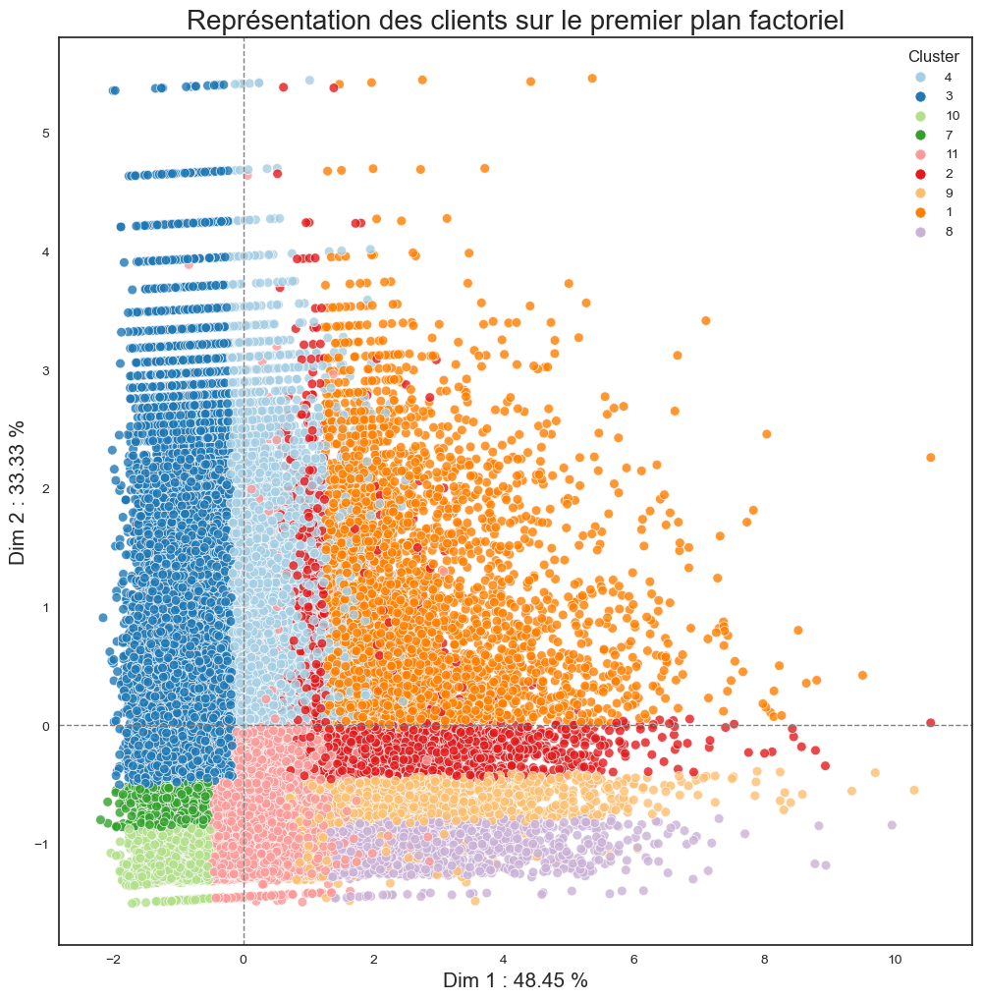

In [54]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA = pd.DataFrame({
    'Dim1' : X_trsf[:, 0], 
    'Dim2' : X_trsf[:, 1],
    'Cluster' : liste_k_seg
})

palette = sns.color_palette('Paired', n_colors=12)

fig = plt.figure(figsize=(12, 12))
g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA,
                        hue = 'Cluster', palette=palette, alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)
plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)
plt.show()

***Données transformées avec PowerTransformer***

In [55]:
# Analyse en composante principale
df_acp_pow = df_rfm_scaled_pow.copy()[['rfm_recence', 'rfm_frequence',
                                       'rfm_montant']]

In [59]:
# Décomposation ACP
pca_rfm_pow = decomposition.PCA()
pca_rfm_pow.fit(df_acp_pow)
expl_var_pow = pca_rfm_pow.explained_variance_ratio_.cumsum()*100
display(f'Explication de la variance : {expl_var_pow}')
X_trsf_pow = pca_rfm_pow.transform(df_acp_pow)

'Explication de la variance : [ 46.42917904  79.77092096 100.        ]'

<span style='background:gold'>**Niveau des clients: rang I (meilleurs) à IV**</span>

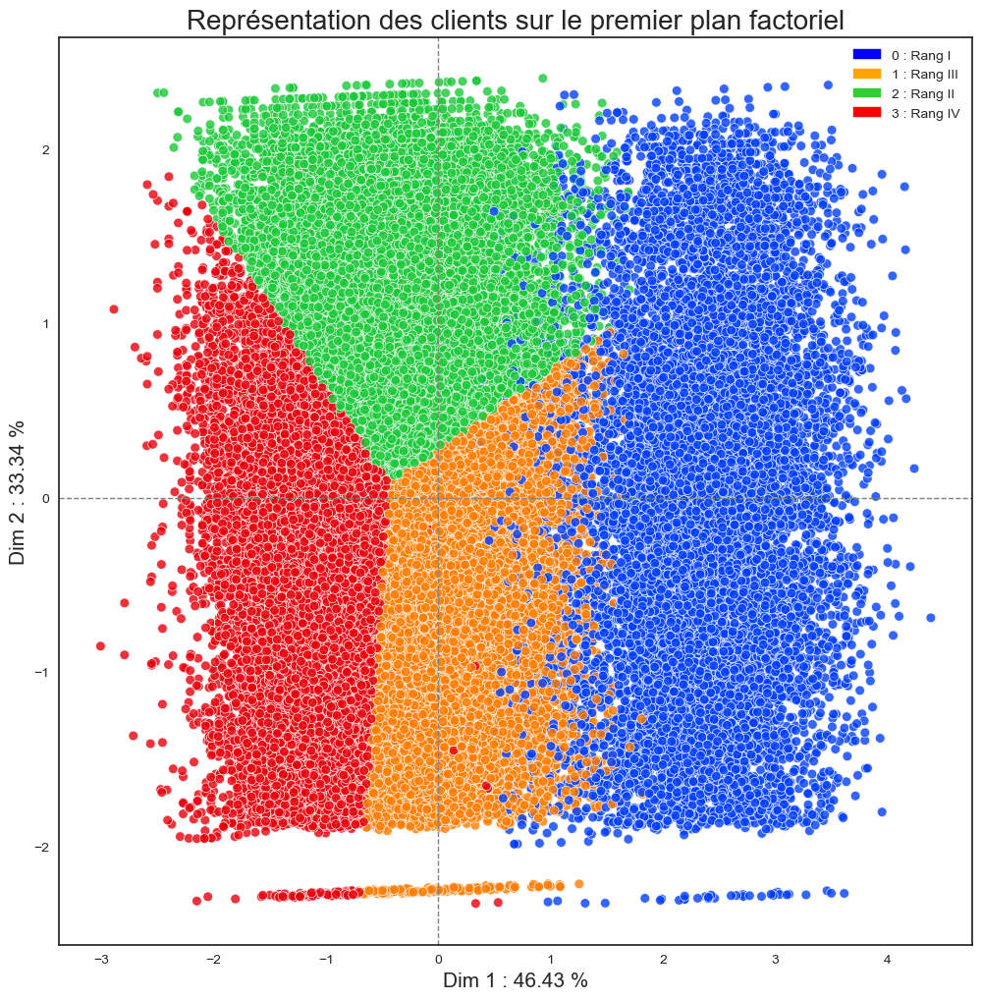

In [61]:
# Niveau des clients : Diamant, platine, argent ou bronze
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA_pow = pd.DataFrame({
    'Dim1' : X_trsf_pow[:, 0], 
    'Dim2' : X_trsf_pow[:, 1],
    'Cluster' : clus_pow.labels_
})

fig = plt.figure(figsize=(12, 12))
g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA_pow,
                        hue = 'Cluster', palette='bright', alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm_pow.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm_pow.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)
plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)

cluster_0 = mpatches.Patch(color='Blue', label='0 : Rang I')
cluster_1 = mpatches.Patch(color='Orange', label='1 : Rang III')
cluster_2 = mpatches.Patch(color='LimeGreen', label='2 : Rang II')
cluster_3 = mpatches.Patch(color='Red', label='3 : Rang IV')
plt.legend(handles=[cluster_0, cluster_1, cluster_2, cluster_3])

plt.show()

<span style='background:gold'>**Decomposition de la segmentation des 11 catégories de clients**</span>

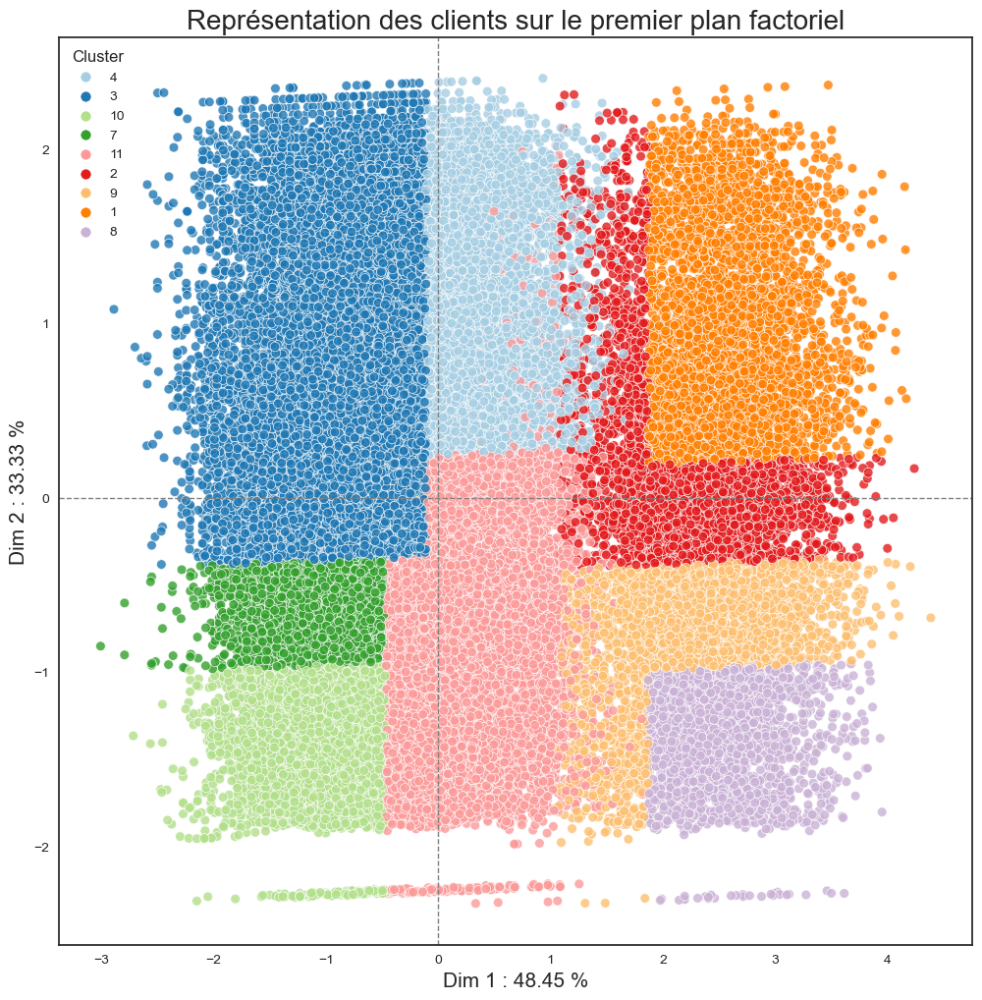

In [63]:
# Niveau des 12 segments clients : Client perdu, nouveau client, VIP...
# --------------------------------------------------------------------
# Transformation en DataFrame pandas
df_PCA_pow = pd.DataFrame({
    'Dim1' : X_trsf_pow[:, 0], 
    'Dim2' : X_trsf_pow[:, 1],
    'Cluster' : liste_k_seg
})

palette = sns.color_palette('Paired', n_colors=12)

fig = plt.figure(figsize=(12, 12))
g_pca = sns.scatterplot(x='Dim1', y='Dim2', data = df_PCA_pow,
                        hue = 'Cluster', palette=palette, alpha=0.8)
plt.title('Représentation des clients sur le premier plan factoriel', 
          size=20)
g_pca.set_xlabel('Dim 1 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[0]* 100,2)) \
                 + ' %', fontsize=15)
g_pca.set_ylabel('Dim 2 : ' + \
                 str(round(pca_rfm.explained_variance_ratio_[1]* 100,2)) \
                 + ' %', fontsize=15)
plt.axvline(color='gray', linestyle='--', linewidth=1)
plt.axhline(color='gray', linestyle='--', linewidth=1)
plt.show()

**Radar Plot sur les différents catégories (niveau des clients)**

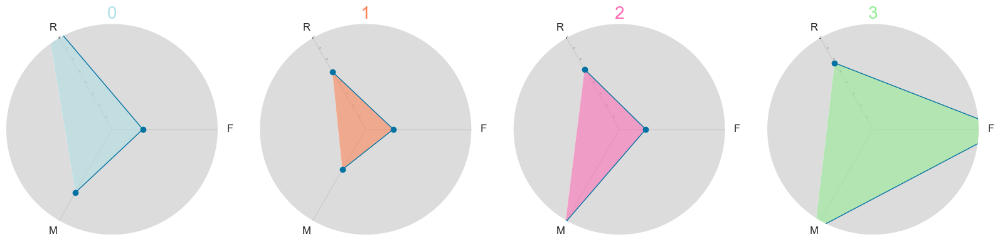

In [49]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_segm_rfm.groupby('K_Cluster')[['R', 'F', 'M']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'Cyan',
          'RoyalBlue', 'Peru', 'MediumPurple', 'Tan', 'Silver',
          'RoyalBlue', 'DarkOrange']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

**Radar Plot sur les 11 catégories de clients**

In [60]:
# Encodage manuelle Segment dans K_segm_client
df_segm_rfm['K_segm_client'] = ['1' if row == 'Champions'
                                 else '2' if row == 'Loyal Customers'
                                 else '3' if row == 'Potential Loyalist'
                                 else '4' if row == 'Recent Customers'
                                 else '5' if row == 'Promising'
                                 else '6' if row == 'Need Attention'
                                 else '7' if row == 'About to Sleep'
                                 else '8' if row == 'Can\'t Lose Them'
                                 else '9' if row == 'At Risk'
                                 else '10' if row == 'Lost customers'
                                 else '11' 
                                 for row in df_segm_rfm['Segment']]

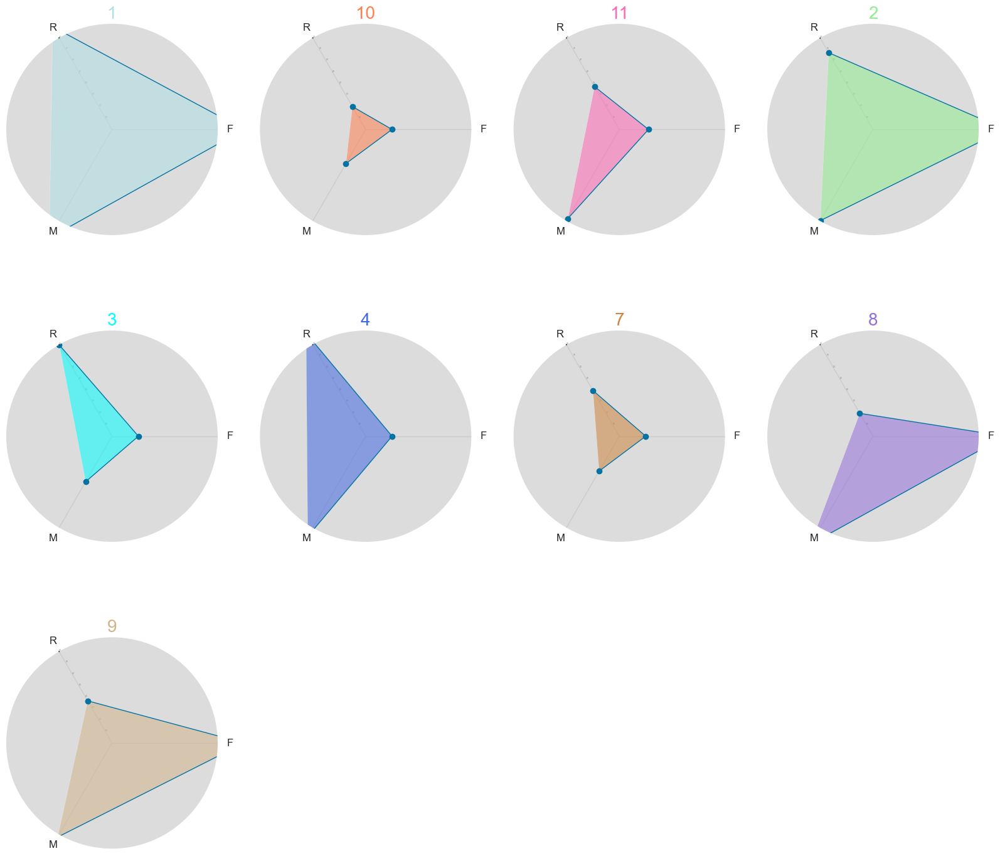

In [62]:
# Radarplot des différents types de client
# ---------------------------------------------------------------------

df_plot = df_segm_rfm.groupby('K_segm_client')[['R', 'F', 'M']].mean()
plt.rc('axes', facecolor='Gainsboro')

# number of variable
categories = list(df_plot.columns)

N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot /
# number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]


fig = plt.figure(1, figsize=(20, 18))

colors = ['PowderBlue', 'Coral', 'HotPink', 'LightGreen', 'Cyan',
          'RoyalBlue', 'Peru', 'MediumPurple', 'Tan', 'Silver',
          'RoyalBlue', 'DarkOrange']

for i, region in enumerate(df_plot.index):

    ax = fig.add_subplot(3, 4, i+1, polar=True)

    ax.set_theta_offset(2*pi/3)
    ax.set_theta_direction(-1)
    ax.set_rlabel_position(0)

    # Draw one axe per variable + add labels labels yet
    plt.xticks(angles, categories, size=10)
    plt.yticks(color="grey", size=2)
    values = df_plot.iloc[i].values
    ax.plot(angles, values, 'o-', linewidth=1, linestyle='solid')
    ax.fill(angles, values, colors[i], alpha=0.55)
    ax.set_xticks(angles)
    ax.set_xticklabels(categories, fontsize=12)
    ax.set_title(region, size=20, color=colors[i])
    ax.grid(True)
    plt.grid(True)
    plt.ylim(0, 4)

plt.show()

In [69]:
df_segm_rfm['Segment'].unique()

array(['Recent Customers', 'Potential Loyalist', 'Lost customers',
       'About to Sleep', 'Others', 'Loyal Customers', 'At Risk',
       'Champions', "Can't Lose Them"], dtype=object)

In [129]:
# Liste des couleurs pour chaque segment
pal = sns.color_palette("husl", len(df_segm_rfm['K_Cluster'].unique()))
colors = {label: color for label, color in zip(df_segm_rfm['K_Cluster'].unique(),
                                                 pal.as_hex())}

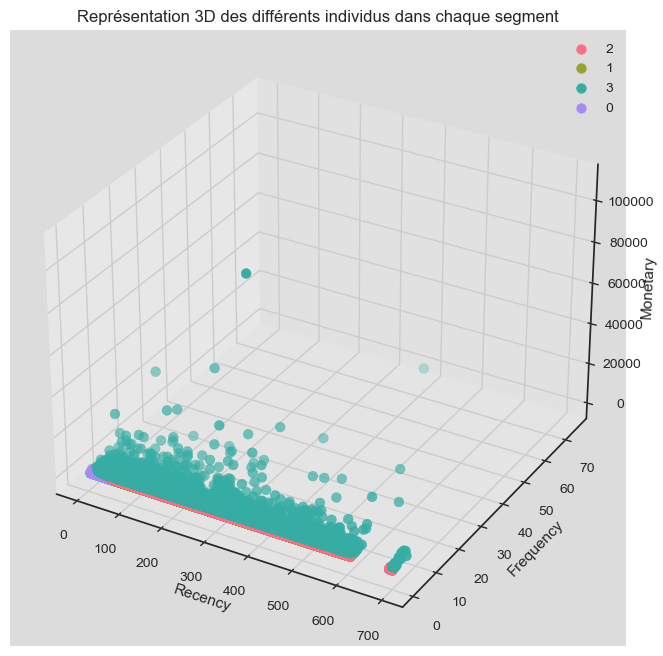

In [70]:
# Graphique 3D (x, y, z) = (Recency, Frequency, Monetary)
fonctions_segmentation.proj_3d_seg(df_segm_rfm, 'K_Cluster', colors)

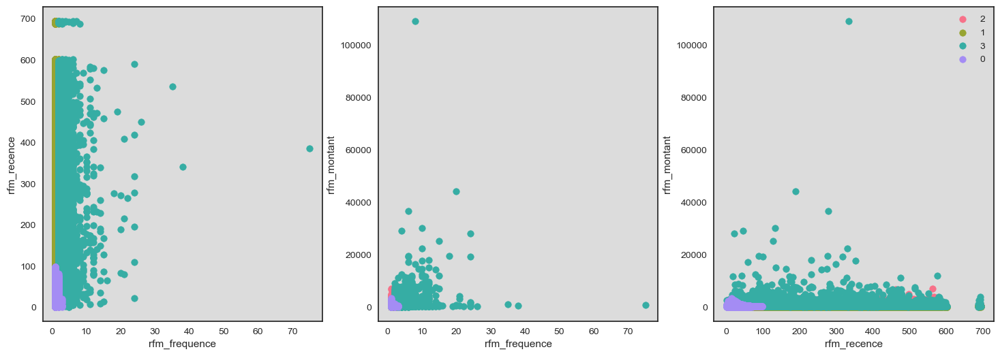

In [71]:
plt.figure(1, figsize=(18, 6))

# 2D plot, Frequence vs Recence
plt.subplot(1, 3, 1)
fonctions_segmentation.proj_2d_seg(df_segm_rfm,
                       "rfm_frequence",
                       "rfm_recence",
                       "K_Cluster",
                       colors=colors)

# 2D plot, Frequency vs Monetary
plt.subplot(1, 3, 2)
fonctions_segmentation.proj_2d_seg(df_segm_rfm,
                       "rfm_frequence",
                       "rfm_montant",
                       "K_Cluster",
                       colors=colors)

# 2D plot, Frequency vs Monetary
plt.subplot(1, 3, 3)
fonctions_segmentation.proj_2d_seg(df_segm_rfm,
                       "rfm_recence",
                       "rfm_montant",
                       "K_Cluster",
                       colors=colors)

plt.legend()
plt.show()

In [72]:
# Réduction dimmensionnelle avec 'Principal Component Analysis'
pca = PCA(n_components=0.90)  # 90% de la variance
rfm_pca = pca.fit_transform(var_rfm_transformed)

# Mise sous forme de DataFrame
rfm_pca = pd.DataFrame(rfm_pca,
                       columns=["Composante_" + str(i)
                                for i in range(rfm_pca.shape[1])])

**Résultat du clustering sur la variation des clusters avec la PCA**

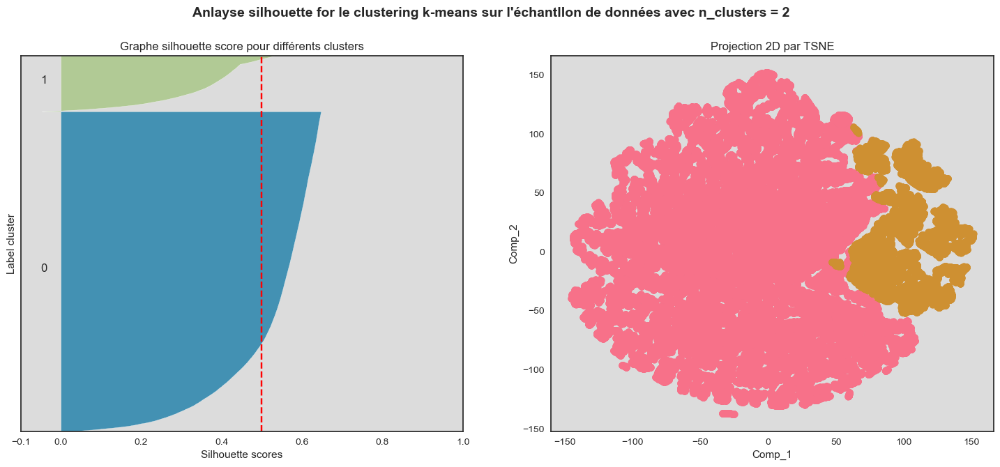

Pour n_clusters = 2 
 Le silhouette score moyen est de : 0.4994595198463282 
 Le temps d'entrainement du modèle est de : 1.072699785232544 (s) 
 Le score de Gini est de : 0.5


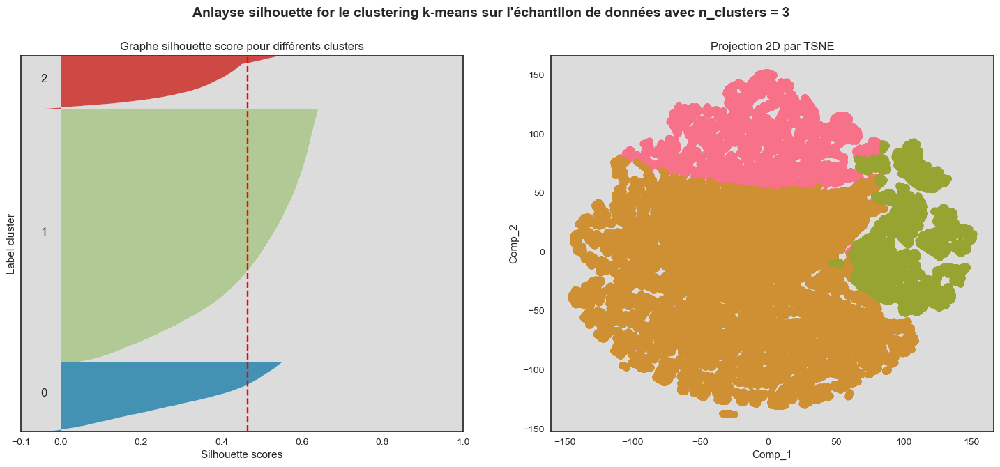

Pour n_clusters = 3 
 Le silhouette score moyen est de : 0.4645115460811643 
 Le temps d'entrainement du modèle est de : 1.110547661781311 (s) 
 Le score de Gini est de : 0.45554124182289957


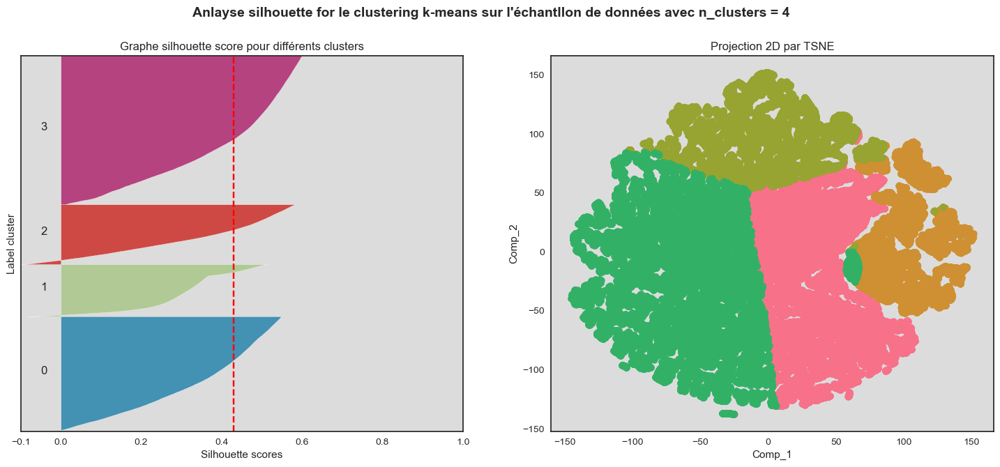

Pour n_clusters = 4 
 Le silhouette score moyen est de : 0.4297415938145304 
 Le temps d'entrainement du modèle est de : 1.1628254254659016 (s) 
 Le score de Gini est de : 0.4918295995809427


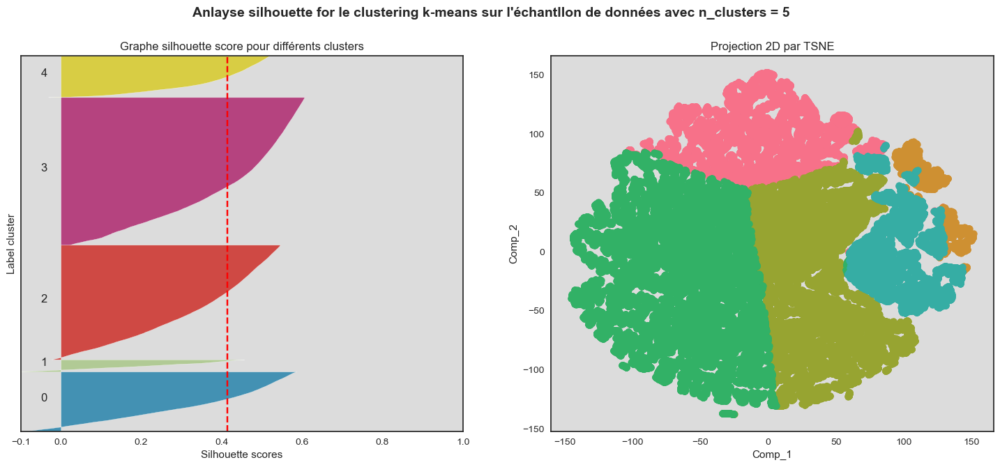

Pour n_clusters = 5 
 Le silhouette score moyen est de : 0.4138918806414528 
 Le temps d'entrainement du modèle est de : 1.220260500907898 (s) 
 Le score de Gini est de : 0.5019658845886782


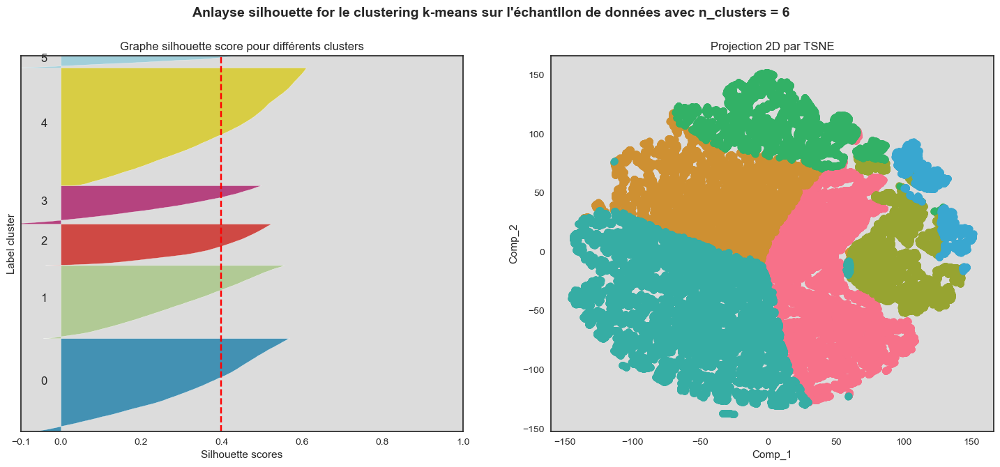

Pour n_clusters = 6 
 Le silhouette score moyen est de : 0.39851460283073126 
 Le temps d'entrainement du modèle est de : 1.2768072605133056 (s) 
 Le score de Gini est de : 0.497536600518949


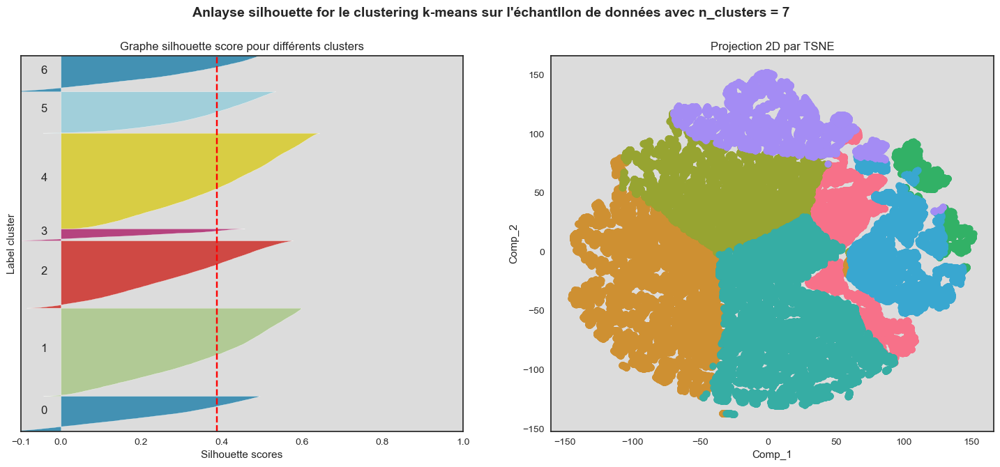

Pour n_clusters = 7 
 Le silhouette score moyen est de : 0.38779790926965424 
 Le temps d'entrainement du modèle est de : 1.516011357307434 (s) 
 Le score de Gini est de : 0.4898648244153123


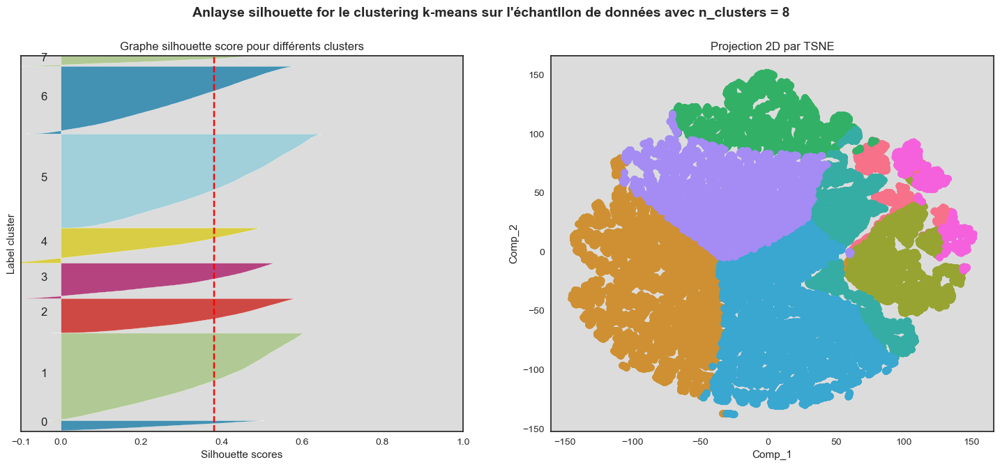

Pour n_clusters = 8 
 Le silhouette score moyen est de : 0.3808913637677385 
 Le temps d'entrainement du modèle est de : 1.7495597430637904 (s) 
 Le score de Gini est de : 0.48625197551885574


([0.4994595198463282,
  0.42956357231600034,
  0.36020168928126267,
  0.36634274112222004,
  0.3370054915878449,
  0.3342144414642693,
  0.3394520907562439],
 [0.5,
  0.41108248364579913,
  0.5644063150970289,
  0.5323747396118846,
  0.4798194642400323,
  0.451505943897129,
  0.46457488214011616],
 [1.072699785232544,
  1.1483955383300781,
  1.267380952835083,
  1.3925657272338867,
  1.5029942989349365,
  2.712031841278076,
  3.1508500576019287])

In [77]:
# Visualisation des clusterings sur les données quantitatives standardisées, transformées en logarithme, avec la PCA

range_nb_clusters = range(2, 9)
fonctions_segmentation.variation_clustering(rfm_pca, range_nb_clusters)

**Constatation**:

- Les meilleurs scores sont enregistrés avec K=3 Clusters, avec un score silhouette moyen de 0.4645, et un indice de Gini de 0.4555

- Nombre de clusters optimaux: **K=3**

## <span style='background:lightblue'>4. Stabilité de la clientèle sur 6 mois</span>

Afin d'analyser la stabilité des segments au cours du temps, nous allons simplement réitéré les étapes précédentes sur des périodes décalés dans l'année de 30 jours, 60 jours, 90 jours, et 180 jours. Il s'agira ensuite de déterminer la stabilité par l'indice de Rand. En effet, l'indice de Rand (ARI: Adjusted Rand Index) est une mesure de similarité entre 2 clusters. 

In [4]:
# Chargement du jeu de données
df_stab = pd.read_csv('OLIST_dataset_analyse_stabilite.csv')

In [5]:
df_stab.drop(columns=['Unnamed: 0'], inplace=True)

In [6]:
# Taille : nombre de lignes/colonnes
nRow, nCol = df_stab.shape
print(f'Le jeu de données contient {nRow} lignes et {nCol} colonnes.')

Le jeu de données contient 121531 lignes et 45 colonnes.


In [7]:
df_stab.head()

,customer_id,customer_unique_id,customer_zip_code_prefix,customer_city,customer_state,order_id,order_purchase_timestamp,order_approved_at,order_delivered_carrier_date,order_delivered_customer_date,...,nbr_commandes,nbr_articles,nbr_articles_mean,panier_moyen,montant_bas,montant_haut,moyen_paiement_prefere,echeance_paiement_mean,frais_port_mean,cat_produit_prefere
0,06b8999e2fba1a1fbc88172c00ba8bc7,861eff4711a542e4b93843c6dd7febb0,14409,franca,SP,00e7ee1b050b8499577073aeb2a297a1,2017-05-16 15:05:35,2017-05-16 15:22:12,2017-05-23 10:47:57,2017-05-25 10:35:35,...,1,1,1.0,124.99,146.87,146.87,credit_card,2.0,21.88,office
1,18955e83d337fd6b2def6b18a428ac77,290c77bc529b7ac935b93aa66c333dc3,9790,sao bernardo do campo,SP,29150127e6685892b6eab3eec79f59c7,2018-01-12 20:48:24,2018-01-12 20:58:32,2018-01-15 17:14:59,2018-01-29 12:41:19,...,1,1,1.0,289.00,335.48,335.48,credit_card,8.0,46.48,appliances
2,4e7b3e00288586ebd08712fdd0374a03,060e732b5b29e8181a18229c7b0b2b5e,1151,sao paulo,SP,b2059ed67ce144a36e2aa97d2c9e9ad2,2018-05-19 16:07:45,2018-05-20 16:19:10,2018-06-11 14:31:00,2018-06-14 17:58:51,...,1,1,1.0,139.94,157.73,157.73,credit_card,7.0,17.79,office
3,b2b6027bc5c5109e529d4dc6358b12c3,259dac757896d24d7702b9acbbff3f3c,8775,mogi das cruzes,SP,951670f92359f4fe4a63112aa7306eba,2018-03-13 16:06:38,2018-03-13 17:29:19,2018-03-27 23:22:42,2018-03-28 16:04:25,...,1,1,1.0,149.94,173.30,173.30,credit_card,1.0,23.36,office
4,4f2d8ab171c80ec8364f7c12e35b23ad,345ecd01c38d18a9036ed96c73b8d066,13056,campinas,SP,6b7d50bd145f6fc7f33cebabd7e49d0f,2018-07-29 09:51:30,2018-07-29 10:10:09,2018-07-30 15:16:00,2018-08-09 20:55:48,...,1,1,1.0,230.00,252.25,252.25,credit_card,8.0,22.25,home


In [81]:
# Dataframe de sauvegarde des métriques de stabilité du dataframe
df_res_rfm = pd.DataFrame({})

In [9]:
# Détermination des dates de référence
# ---------------------------------------------------------------------
# Date de référence de la période complète ?
date_ref = df_stab['order_purchase_timestamp'].max()
print(f'Data de référence période complète : {date_ref}')
# Data de référence transformée
date_ref = pd.to_datetime(date_ref,
                                format='%Y-%m-%d %H:%M:%S')
# Data de référence de la première période historique - 30 jours
data_ref_30jours = date_ref - dt.timedelta(days=30)
print(f'Data de référence histo - 30 jours : {data_ref_30jours}')

# Data de référence de la première période historique - 60 jours
data_ref_60jours = date_ref - dt.timedelta(days=60)
print(f'Data de référence histo - 60 jours : {data_ref_60jours}')

# Data de référence de la première période historique - 90 jours
data_ref_90jours = date_ref - dt.timedelta(days=90)
print(f'Data de référence histo - 90 jours : {data_ref_90jours}')

# Data de référence de la première période historique - 180 jours
data_ref_180jours = date_ref - dt.timedelta(days=180)
print(f'Data de référence histo - 180 jours : {data_ref_180jours}')

Data de référence période complète : 2018-08-29 15:00:37
Data de référence histo - 30 jours : 2018-07-30 15:00:37
Data de référence histo - 60 jours : 2018-06-30 15:00:37
Data de référence histo - 90 jours : 2018-05-31 15:00:37
Data de référence histo - 180 jours : 2018-03-02 15:00:37


In [83]:
df_res_rfm, df_rfm_60jours = \
    fonctions_segmentation.segm_rfm_periode(df_stab, df_segm_rfm,
                                         df_res_rfm,
                                         'customer_unique_id',
                                         'order_purchase_timestamp',
                                         'order_id',
                                         'payment_value',
                                         data_ref_60jours,
                                         '60_jours_avant')

Période : Min : 2016-10-03 09:44:50, Max : 2018-06-30 14:52:27
Date de référence : 2018-07-01 14:52:27
(79221, 12)
(79221, 11)
Métrique ARI rfm (%) : 58.174
Métrique ARI clusters (%) : 75.589


In [84]:
df_res_rfm, df_rfm_90jours = \
    fonctions_segmentation.segm_rfm_periode(df_stab, df_segm_rfm,
                                         df_res_rfm,
                                         'customer_unique_id',
                                         'order_purchase_timestamp',
                                         'order_id',
                                         'payment_value',
                                         data_ref_90jours,
                                         '90_jours_avant')

Période : Min : 2016-10-03 09:44:50, Max : 2018-05-31 14:51:03
Date de référence : 2018-06-01 14:51:03
(73398, 12)
(73398, 11)
Métrique ARI rfm (%) : 61.258
Métrique ARI clusters (%) : 67.088


In [85]:
df_res_rfm, df_rfm_180jours = \
    fonctions_segmentation.segm_rfm_periode(df_stab, df_segm_rfm,
                                         df_res_rfm,
                                         'customer_unique_id',
                                         'order_purchase_timestamp',
                                         'order_id',
                                         'payment_value',
                                         data_ref_180jours,
                                         '180_jours_avant')

Période : Min : 2016-10-03 09:44:50, Max : 2018-03-02 14:59:29
Date de référence : 2018-03-03 14:59:29
(54355, 12)
(54355, 11)
Métrique ARI rfm (%) : 57.385
Métrique ARI clusters (%) : 67.489


In [86]:
# Les scores ARI des différentes périodes d'historique
df_res_rfm.style.hide_index()

Periode,ARI_rfm (%),ARI_clusters (%)
30_jours_avant,68.703000,91.264000
60_jours_avant,58.174000,75.589000
90_jours_avant,61.258000,67.088000
180_jours_avant,57.385000,67.489000


La stabilité des 2 méthodes étant bien différente, la fréquence à laquelle il est souhaitable de faire une maintenance dépend de la méthodologie choisie.

Pour la segmentation par quantiles, une maintenance tous les 30 jours est nécessaire, alors que pour la méthode du clustering, une mise à jour tous les 90 jours suffit (environ 3 mois).

### <span style='background:aquamarine'>4.1  Méthodologie 1 : Segmentation RFM par quantile</span>

In [52]:
# Liste des couleurs pour chaque segment
categ = df_rfm_30jours['Segment'].unique()
pal = sns.color_palette("husl", len(categ))
colors = {label: color for label, color in zip(categ,
                                                 pal.as_hex())}

In [64]:
id_clients = list(set(df_rfm_30jours["customer_unique_id"]).intersection(df_rfm_60jours["customer_unique_id"])\
                                                 .intersection(df_rfm_90jours["customer_unique_id"])\
                                                 .intersection(df_rfm_180jours["customer_unique_id"]))

sankey_data_1 = fonctions_segmentation.sankey_data('Segment',
                            df_rfm_30jours.loc[df_rfm_30jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            df_rfm_60jours.loc[df_rfm_60jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            df_rfm_90jours.loc[df_rfm_90jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            df_rfm_180jours.loc[df_rfm_180jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            )

# Associe les couleurs correspondantes aux segments
sankey_data_1["colors"] = [colors[label] for label in sankey_data_1["label"]]

In [76]:
# Affiche le diagramme de Sankey
fig = go.Figure(data=[go.Sankey(
    node=dict(
              pad=15,
              thickness=25,
              line=dict(color="black", width=0.1),
              label=sankey_data_1["label"],
              color=sankey_data_1["colors"]  # colors for each label
    ),
    link=dict(
              source=sankey_data_1["source"],  # indices correspond to labels
              target=sankey_data_1["target"],
              value=sankey_data_1["value"],
              label=sankey_data_1["label"] 
    ),
)])

fig.update_layout(title_text="Evolution temporelle des clients"
                             " dans chaque segment RFM",
                  font_size=10,
                  font=dict(size = 10, color = 'white'),
    paper_bgcolor='black')

fig.show()

La colonne de gauche correspond à une photo des clients à la date t0+30. La deuxième, troisème et quatrième colonne correspondent respectivement aux dates t0 + 60 jours, t0 + 90 jours, t0 + 180 jours

### <span style='background:aquamarine'>4.2  Méthodologie 2 : Clustering RFM</span>

In [77]:
# Liste des couleurs pour chaque segment
categ = df_rfm_30jours['clusters'].unique()
pal = sns.color_palette("husl", len(df_rfm_30jours['clusters'].unique()))
colors_2 = {label: color for label, color in zip(categ,
                                                 pal.as_hex())}

In [78]:
id_clients = list(set(df_rfm_30jours["customer_unique_id"]).intersection(df_rfm_60jours["customer_unique_id"])\
                                                 .intersection(df_rfm_90jours["customer_unique_id"])\
                                                 .intersection(df_rfm_180jours["customer_unique_id"]))

sankey_data_2 = fonctions_segmentation.sankey_data('clusters',
                            df_rfm_30jours.loc[df_rfm_30jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            df_rfm_60jours.loc[df_rfm_60jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            df_rfm_90jours.loc[df_rfm_90jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            df_rfm_180jours.loc[df_rfm_180jours["customer_unique_id"].isin(id_clients)].reset_index(),
                            )

# Associe les couleurs correspondantes aux segments
sankey_data_2["colors"] = [colors_2[label] for label in sankey_data_2["label"]]

In [80]:
# Affiche le diagramme de Sankey
fig = go.Figure(data=[go.Sankey(
    node=dict(
              pad=15,
              thickness=25,
              line=dict(color="black", width=0.1),
              label=sankey_data_2["label"],
              color=sankey_data_2["colors"]  # colors for each label
    ),
    link=dict(
              source=sankey_data_2["source"],  # indices correspond to labels
              target=sankey_data_2["target"],
              label=sankey_data_2["label"], 
              value=sankey_data_2["value"]
    ),
)])

fig.update_layout(title_text="Evolution temporelle des clients"
                             " dans chaque segment RFM",
                  font_size=10,
                 font=dict(size = 10, color = 'white'),
                 paper_bgcolor='black')


fig.show()

De la meme manière que la segmentation pour le score RFM, la colonne de gauche correspond à une photo des clients à la date t0+30. La deuxième, troisème et quatrième colonne correspondent respectivement aux dates t0 + 60 jours, t0 + 90 jours, t0 + 180 jours